This pipeline opens the result of PCA / ICA analysis, sort the components by brain regions, lets the user interactively label the components that look like neuronal activity (rather than movement artefacts or noise), and plots a summary.

In [1]:
clear all

In [2]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy import io
import scipy.io as sio
%matplotlib inline 
import pylab
import csv
from Tkinter import Tk
from tkFileDialog import askopenfilename
from tkFileDialog import askdirectory
import nibabel as nb
from scipy import io
from nifti import NiftiImage
import nibabel as nb
from scipy.interpolate import interp1d
from scipy import ndimage

# Open data

Open time series from PCA ICA

In [3]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/home/sophie/100051/100051ss1_1000regcU10sMpsfkf108Smith0_4_60TS.mat


In [4]:
Ua=sio.loadmat(filename)
DT=Ua['TSo']
DT.shape

(11571, 108)

Open time series from averaring in ROI

In [5]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/home/sophie/100051/100051ss1_1000regcU10sMpsfkf108Smith0_4_60TSzmap.mat


In [6]:
Ua2=sio.loadmat(filename)
DTroi=Ua2['TSzmapo']
DTroi.shape

(11571, 108)

In [7]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename2 = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename2)

/home/sophie/100051/100051ss1_1000regcU10sMpsfkf108Smith0_4_60IC.nii


In [8]:
img1 = nb.load(filename2)
data = img1.get_data()
S=data.shape
S

(92, 44, 11, 108)

In [9]:
Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/home/sophie/100051/100051TimeOn.mat


In [10]:
Ua=sio.loadmat(filename)
Time_fluo=Ua['Time']
Time_fluo.shape

(11571, 1)

In [11]:
Time_fluoICA=Time_fluo

In [12]:
Time_fluoICA.shape

(11571, 1)

Z-score

In [13]:
Demean=np.zeros(S)
Dmaps=np.zeros(S)
Dvar=np.zeros(S)
Var=np.zeros(S[3])
D2=np.zeros([S[0],S[1],5,S[3]])
Tvar=np.zeros(S[3])

In [14]:
for i in range(S[3]):
    Demean[:,:,:,i]=data[:,:,:,i]-np.mean(np.mean(np.mean(data[:,:,:,i],0),0),0)

In [15]:
for i in range(S[3]):
    Dsq=np.reshape(Demean[:,:,:,i],S[0]*S[1]*S[2])
    Var[i]=np.sqrt(np.var(Dsq))
    Dvar=Demean[:,:,:,i]/Var[i]
    Dmaps[:,:,:,i]=Dvar-2.5
    Tvar[i]=np.var(DT[i,:])
Dmaps[Dmaps<0]=0

# Open Masks

In [16]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from Tkinter import Tk
from tkFileDialog import askopenfilename

Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filenameM = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filenameM)
img1 = nb.load(filenameM)
Masks = img1.get_data()
Sm=Masks.shape
Masks=np.array(Masks)

/home/sophie/100051/100051ResizedMapsfullpsftrimmed.nii


In [17]:
filenameM='/home/sophie/Desktop/Registration/RegionList'
with open(filenameM) as f:
    content = f.readlines()
Names=[Line.split('\t') for Line in content]
RegionName=[Names[i][0] for i in range(75)]
Num=[int(Names[i][2]) for i in range(75)]

# Average in masks to sort components by brain region

In [18]:
Dmaps.shape

(92, 44, 11, 108)

In [19]:
M=np.zeros((S[3],86))
Mapmean=np.zeros(S[3])
MMasks=np.zeros(86)

In [20]:
for i in range(S[3]):
    Mapmean[i]=np.mean(np.mean(np.mean(Dmaps[:,:,:,i])))
    for j in range(86):
        MMasks[j]=np.mean(np.mean(np.mean(Masks[:,:,:,j])))
        if MMasks[j]:
            M[i,j]=np.mean(np.mean(np.mean(Masks[:,:,:,j]*Dmaps[:,:,:,i])))/(MMasks[j]*Mapmean[i])

In [21]:
CompMainName=S[3]*['']
CompNameAdd=np.zeros((S[3],86))
for i in range(S[3]):
    Max=np.max(M[i,:])
    I=np.argmax(M[i,:])+1
    for j in range(86):
        J=[l for l in range(74) if Num[l]==(j+1)]
        if M[i,j]>0.2*Max:
            CompNameAdd[i,J]=1
    J=[l for l in range(74) if Num[l]==I]
    CompMainName[i]=Names[np.array(J)][0]

LO_R
12
lobula


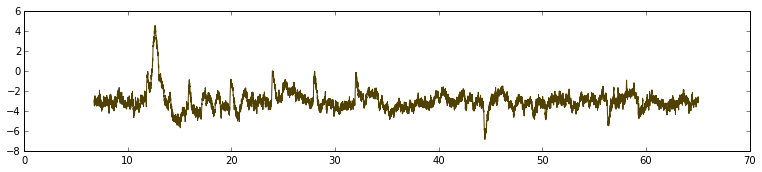

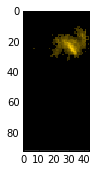

NO
PB
20
NO
PB
24
nodulus


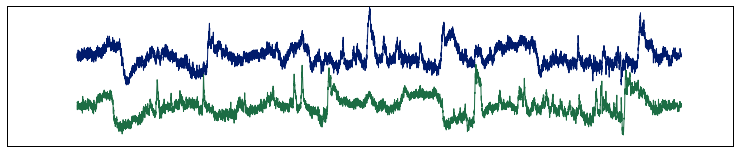

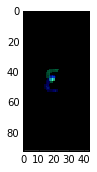

PB
IPS_R
SLP_L
IPS_L
19
PB
ATL_R
MB_CA_R
37
PB
FB
45
PB
103
protocerebral bridge


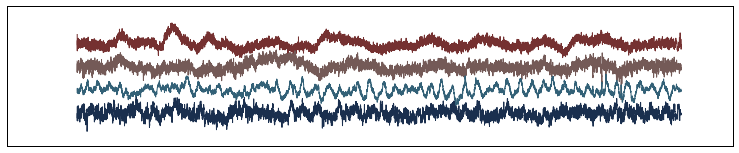

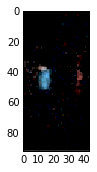

LH_R
2
lateral horn


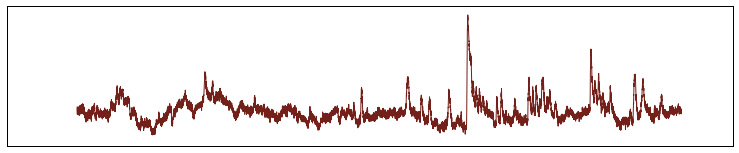

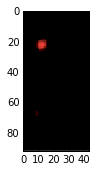

NO
ATL_R
SLP_R
88
antler


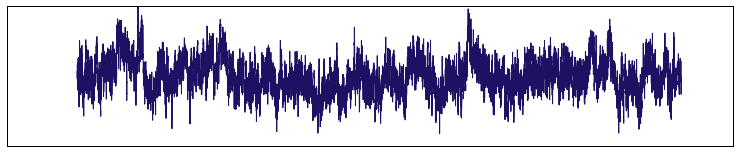

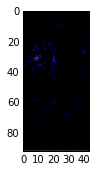

MB_VL_R
LOP_L
ME_L
17
vertical lobe of adult mushroom body


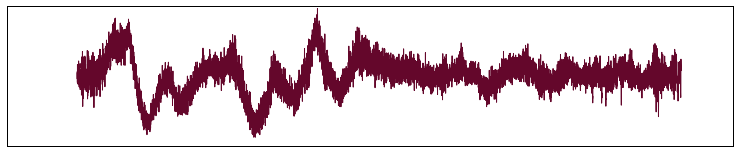

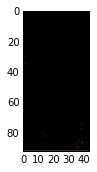

LO_R
LOP_R
ME_R
ME_L
28
lobula plate


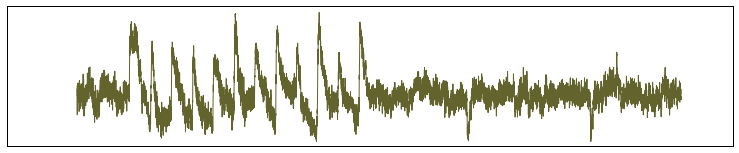

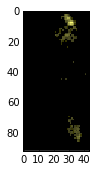

AL_R
MB_CA_R
26
adult antennal lobe


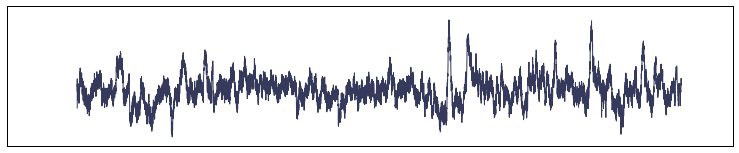

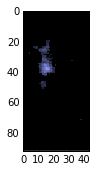

LOP_R
ME_R
0
BU_R
ME_R
39
LO_R
LOP_R
ME_R
SIP_R
65
medulla


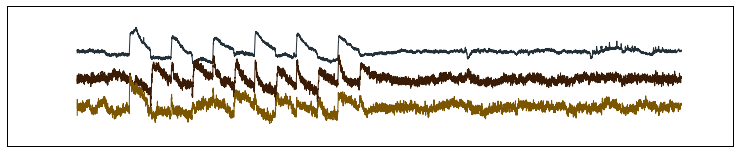

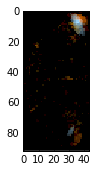

SLP_R
MB_CA_L
80
superior lateral protocerebrum


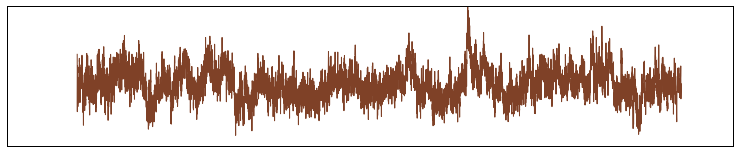

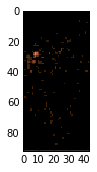

SMP_R
SMP_L
78
superior medial protocerebrum


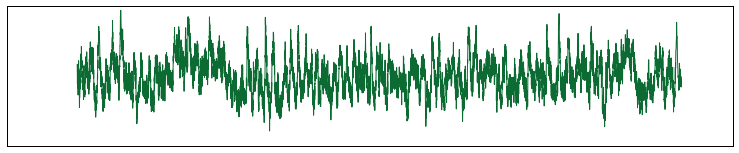

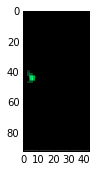

MB_CA_R
3
MB_CA_R
10
MB_CA_R
15
MB_CA_R
44
MB_CA_R
PRW
49
MB_CA_R
50
MB_CA_R
70
MB_CA_R
IPS_R
MB_CA_L
76
calyx of adult mushroom body


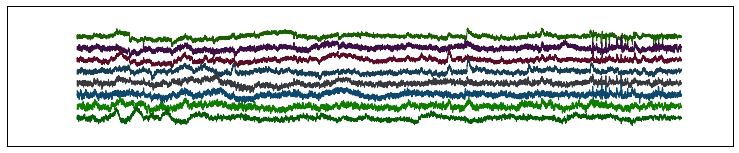

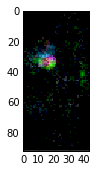

IB_R
SPS_R
SPS_L
52
superior posterior slope


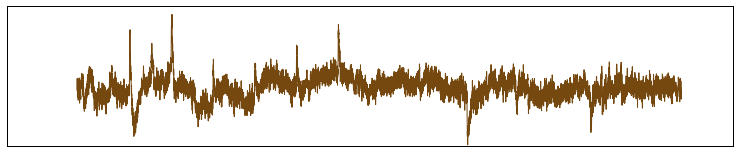

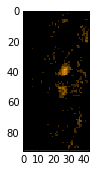

MB_CA_R
IPS_R
GNG
63
inferior posterior slope


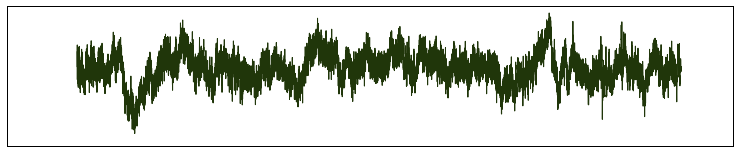

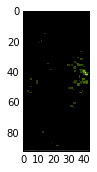

SAD
GNG
22
GNG
55
adult gnathal ganglion


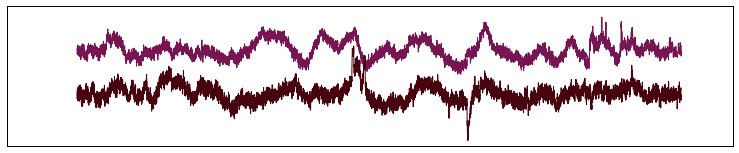

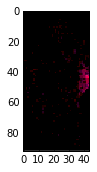

PRW
25
MB_VL_R
MB_CA_R
PRW
AL_L
92
prow


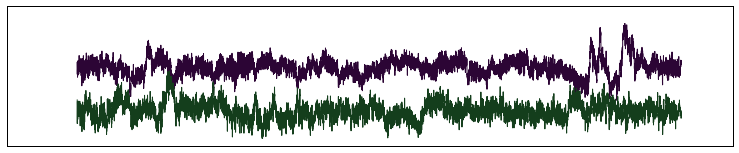

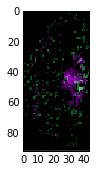

LO_L
ME_L
32
lobula


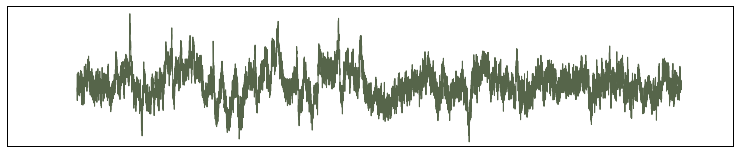

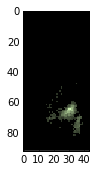

LH_L
MB_CA_L
11
LH_L
MB_CA_L
18
lateral horn


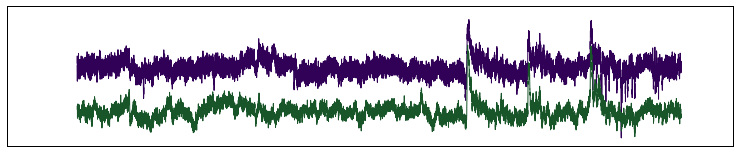

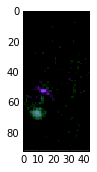

PB
MB_CA_R
ATL_L
69
ATL_L
86
antler


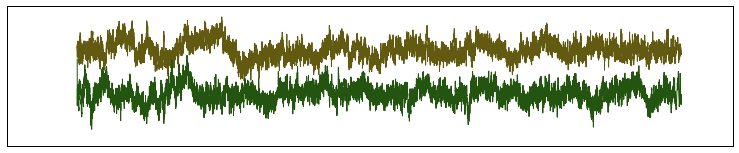

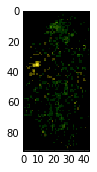

FLA_L
SPS_L
9
FLA_L
AL_L
41
PRW
CAN_L
FLA_L
59
flange


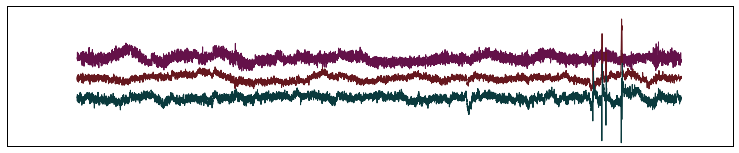

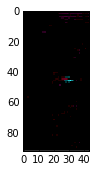

LOP_R
LO_L
LOP_L
14
lobula plate


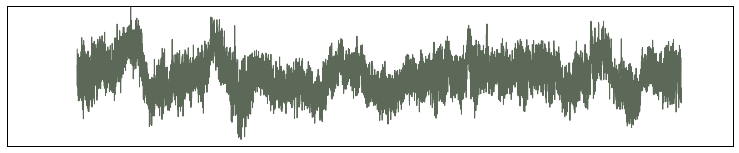

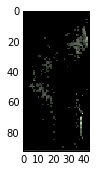

AL_L
34
LAL_L
AL_L
35
IB_R
MB_CA_R
AMMC_L
AL_L
46
adult antennal lobe


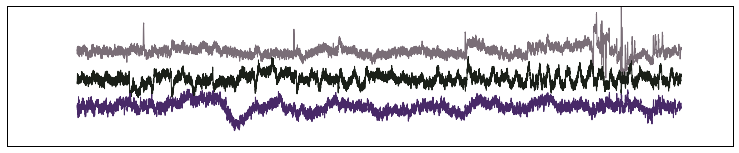

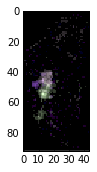

ME_L
5
LOP_R
ME_R
ME_L
21
LO_L
LOP_L
ME_L
30
AME_L
LO_L
ME_L
31
medulla


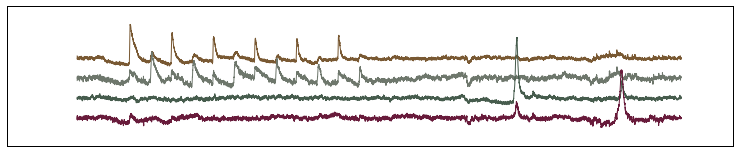

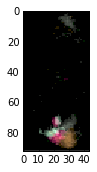

LH_L
MB_CA_L
1
MB_CA_L
6
MB_CA_L
29
LO_L
LOP_L
MB_CA_L
43
ATL_R
MB_CA_L
54
MB_CA_L
61
BU_R
MB_CA_L
96
calyx of adult mushroom body


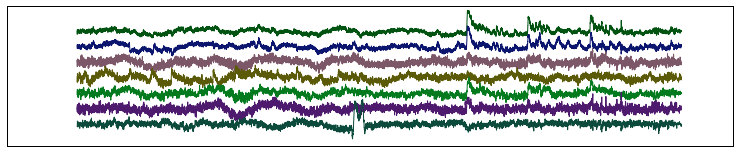

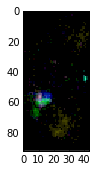

MB_VL_R
IPS_R
GNG
IPS_L
13
inferior posterior slope


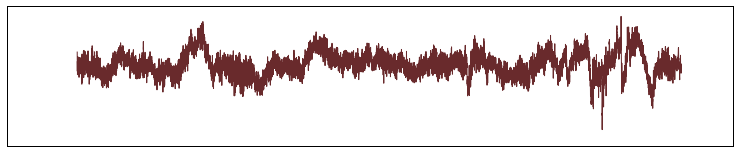

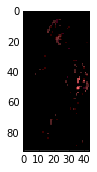

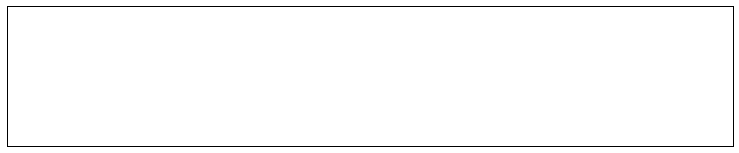

In [22]:
pylab.rcParams['figure.figsize'] = (13, 2.5)

h=5
tot=0
GoodICAnat=np.zeros(S[3])

for l in range(74):
    Final_maps=np.zeros((S[0],S[1],3))
    Fmap=np.zeros((S[0],S[1],3))
    C=np.zeros(3)

    n=0
    for i in range(len(CompMainName)):                    
        Dmmv=np.mean(data[:,:,:,i],2) 
        Dmmv[Dmmv<0.2*np.max(np.max(np.max(Dmmv)))]=0
        C=np.squeeze(np.random.rand(3,1))
        labeled, nrobject=ndimage.label(Dmmv>0)
        
        if CompMainName[i]==Names[l][0] and (sum(CompNameAdd[i,:])<5) and nrobject<200:
            n=n+1            
            
            for k in range(3):
                Fmap[:,:,k]=0.7*Dmmv*C[k]/np.max(C)
            Final_maps=Final_maps+Fmap
            plt.plot(Time_fluoICA,(DT[:,i]/np.sqrt(np.var(DT[:,i]))-h*n+2),color=C/2)
            tot=tot+1
            GoodICAnat[i]=1
            #print(i)
            for j in range(86):
                if CompNameAdd[i,j]==1:                
                    print(Names[np.array(j)][0])
            print(i)
            
                    
    if n!=0:
        print(Names[l][1])

        plt.show()
        FM=Final_maps/np.max(np.max(Final_maps))
        FM[FM<0.1]=0
        plt.imshow(FM,interpolation='none')
        plt.show()
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)

# Pruning by hand

In [23]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from Tkinter import Tk
from tkFileDialog import askopenfilename

Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filenamet = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filenamet)
nimt=NiftiImage(filenamet)
Dtemp=np.squeeze(nimt.data.T)
Dtemp.shape

/home/sophie/100051/100051ss1_1000regctemppsf.nii


(92, 44, 11)

In [24]:
%%javascript
IPython.OutputArea.auto_scroll_threshold =4000;

In [25]:
if S[2]>5:
    Nstack=5
    Int100=[(i+1)*100/Nstack for i in range(Nstack)]
    Percs=np.percentile(range(S[2]),Int100)
    Indices=np.split(range(S[2]),Percs)
    D1=np.zeros([S[0],S[1],Nstack])
    Dmean=np.squeeze(data[:,:,range(Nstack),2])
    for i in range(Nstack):
        Vmean=np.mean(Dtemp[:,:,Indices[i]],2)
        Dmean[:,:,i]=Vmean
else:
    Nstack=S[2]
    D1=np.zeros([S[0],S[1],S[2]])
    Dmean=data[:,:,range(S[2])]  
    Dmean=np.squeeze(Dtemp[:,:,:])

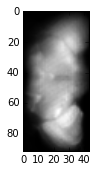

In [26]:
plt.imshow(Dmean[:,:,1],cmap=plt.cm.gray)

In [27]:
S

(92, 44, 11, 108)

In [28]:
my_cmap=plt.cm.jet
my_cmap.set_bad(alpha=0)
Good_ICs=np.zeros(S[3])
Label_ICs=[]
pylab.rcParams['figure.figsize'] = (15, 2.5)

Enter 'a' for activity if good component:
- Map well defined (not scatered points all over the brain)
and
- Similarity of of the time series from region of interest and PCA/ICA result or 
- Time series from ROI looks like typical movement artefact (like for the noise components with scatered maps) but time series from PCA / ICA has a clear distinct structure (this suggest that the ROI time series is dominated by noise and artefact but the PCA/ICA is able to extract signals).

0
ME_R


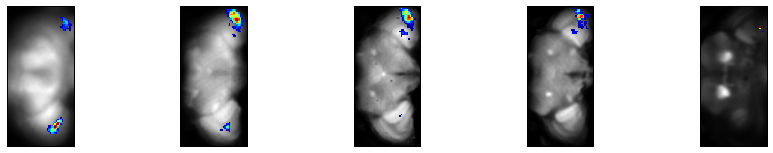

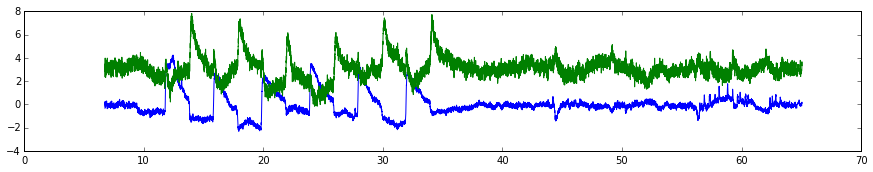


1
MB_CA_L


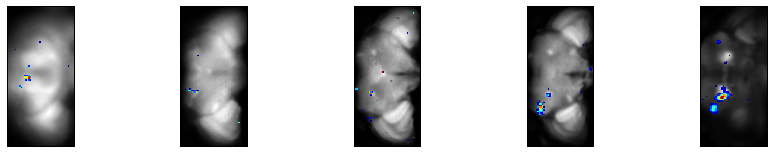

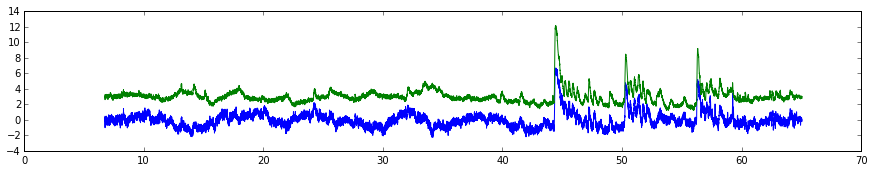

a
2
LH_R


/usr/local/lib/python2.7/dist-packages/numpy/ma/core.py:4085: UserWarning: Warning: converting a masked element to nan.
  warnings.warn("Warning: converting a masked element to nan.")


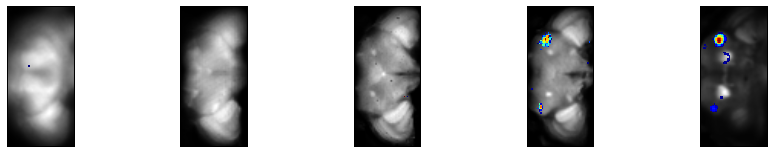

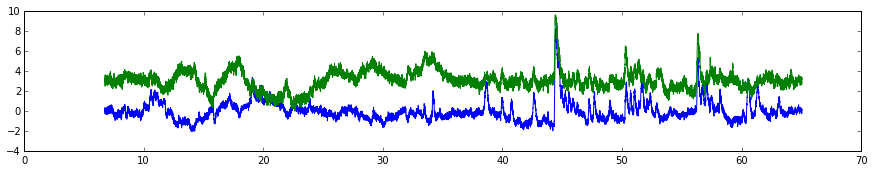

a
3
MB_CA_R


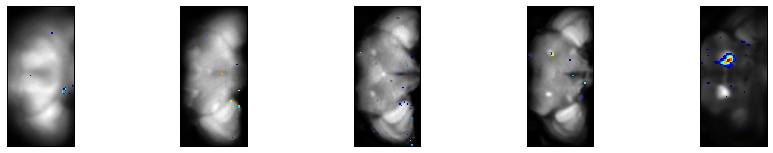

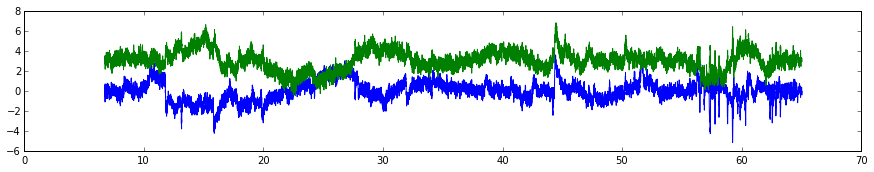


4
IPS_R


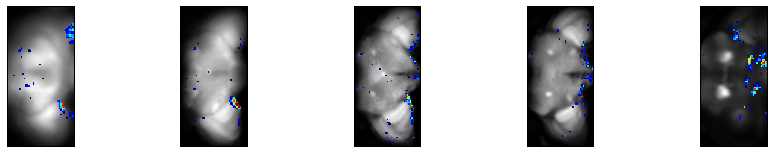

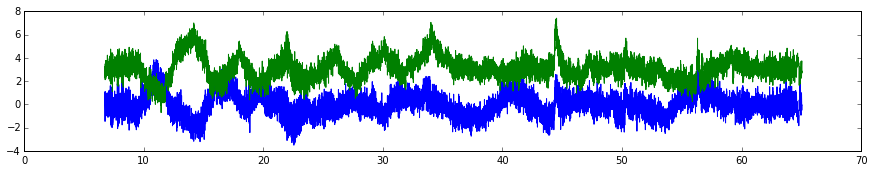


5
ME_L


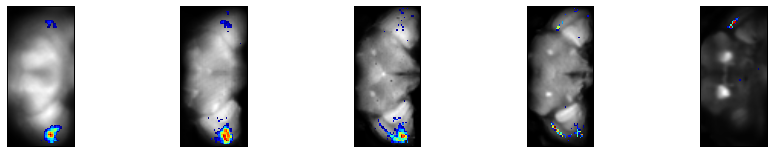

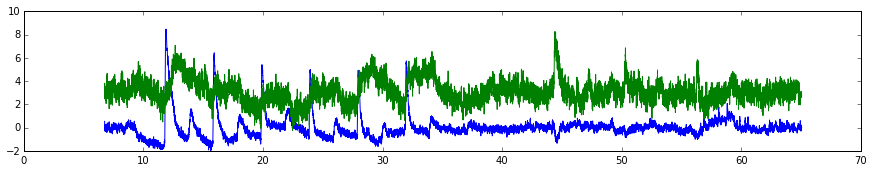

a
6
MB_CA_L


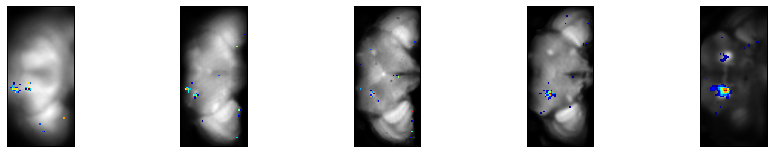

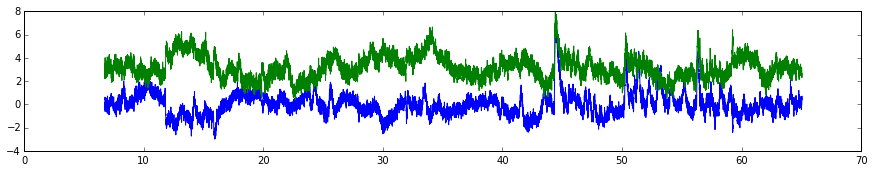

a
7
LOP_L


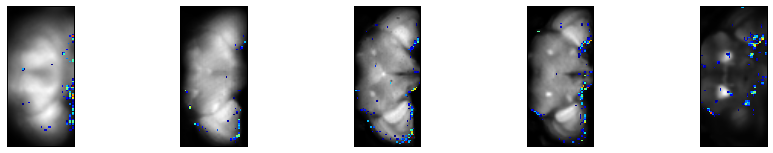

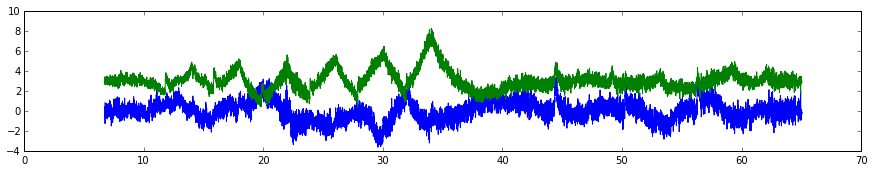


8
IPS_L


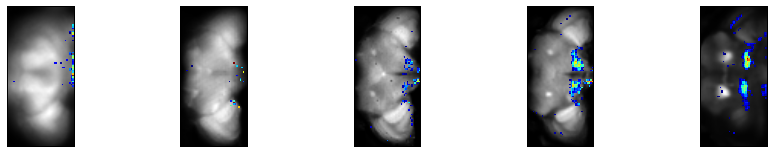

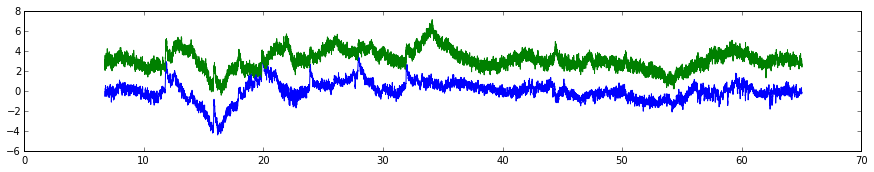

a
9
FLA_L


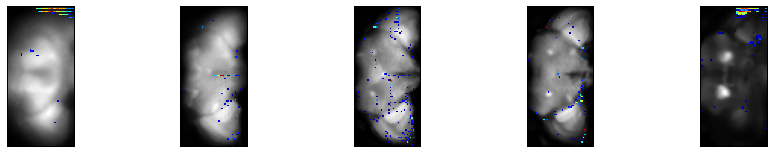

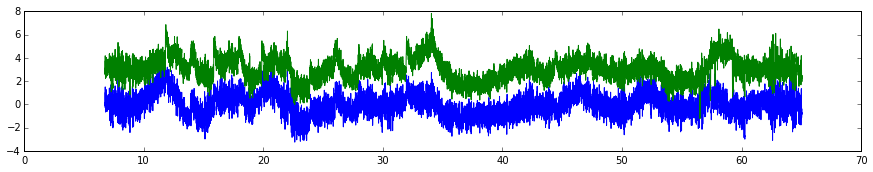


10
MB_CA_R


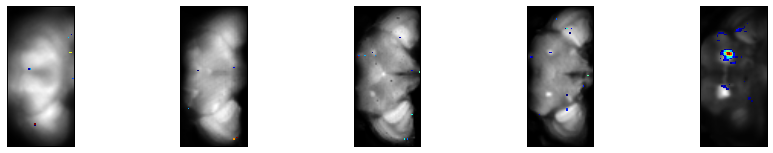

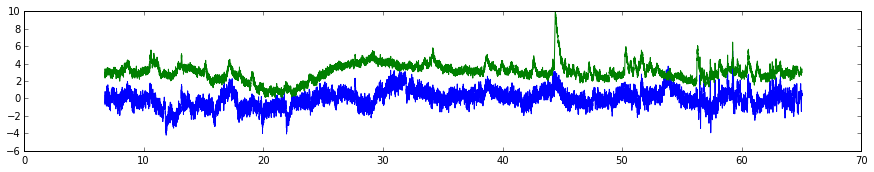


11
LH_L


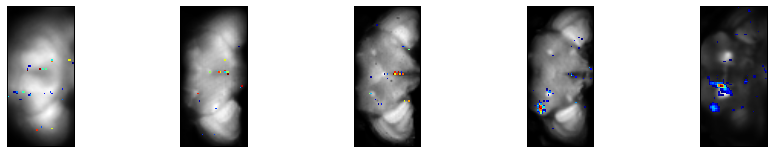

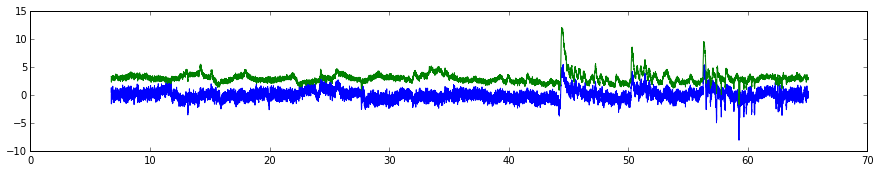


12
LO_R


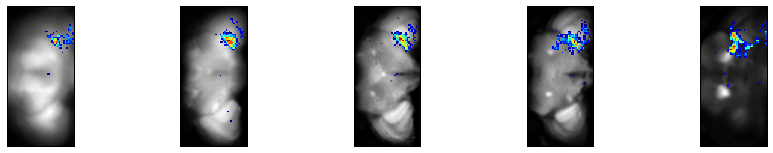

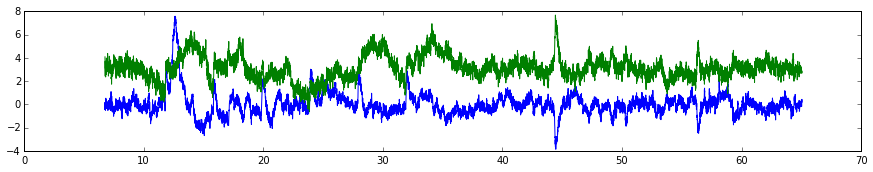


13
IPS_L


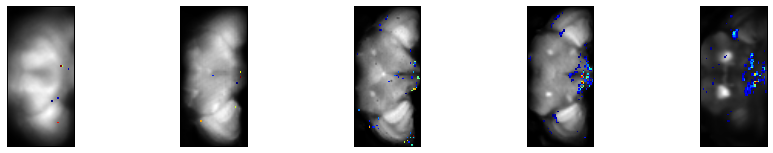

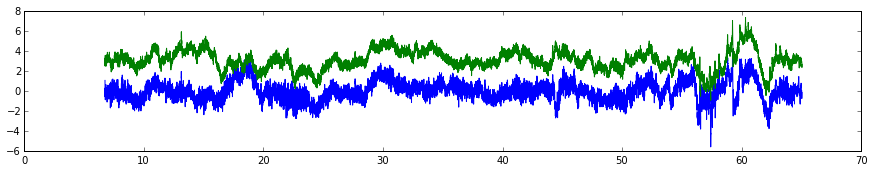


14
LOP_L


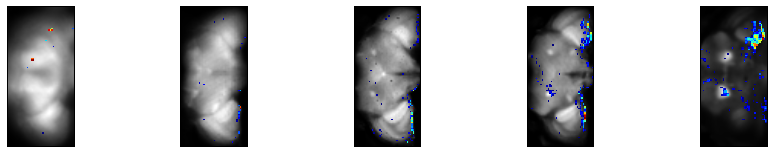

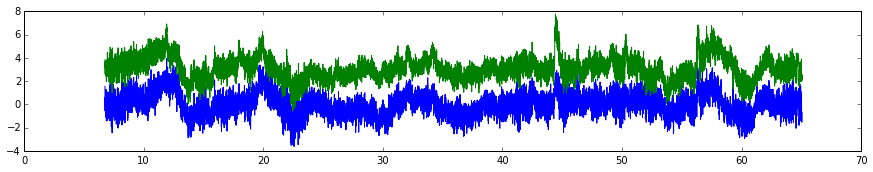


15
MB_CA_R


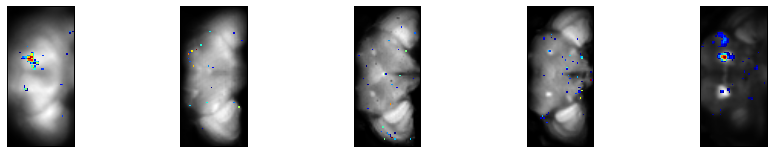

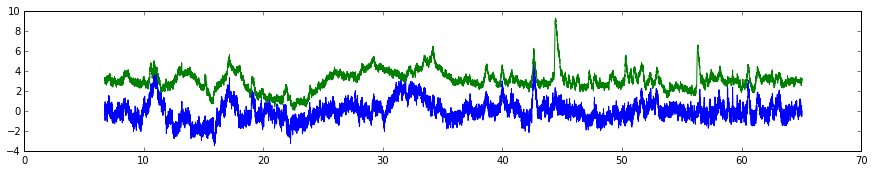


16
MB_CA_L


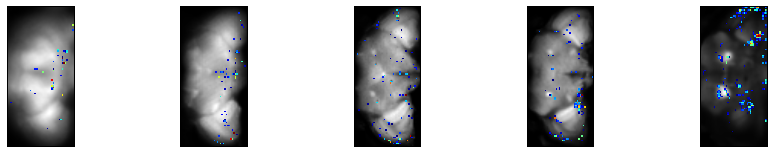

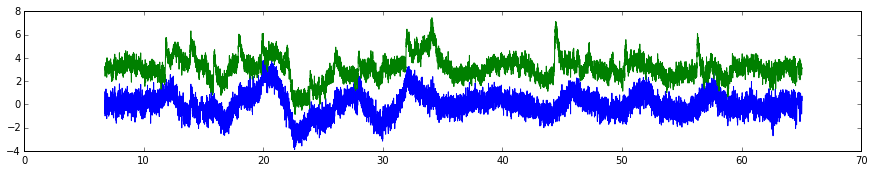


17
MB_VL_R


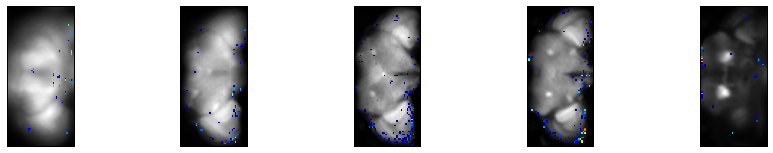

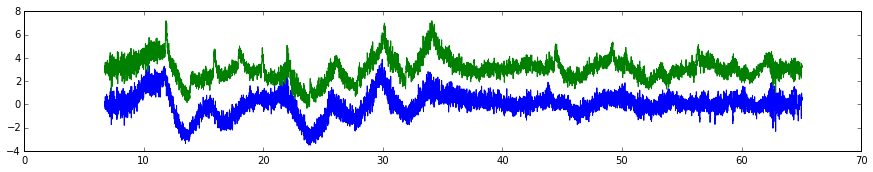


18
LH_L


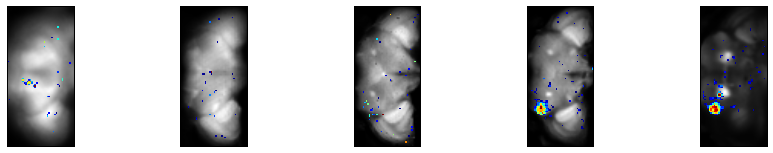

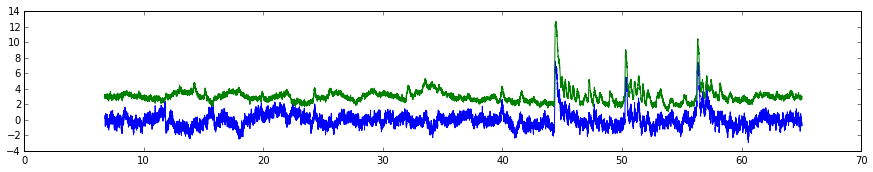

a
19
PB


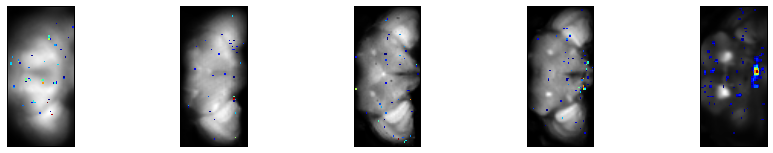

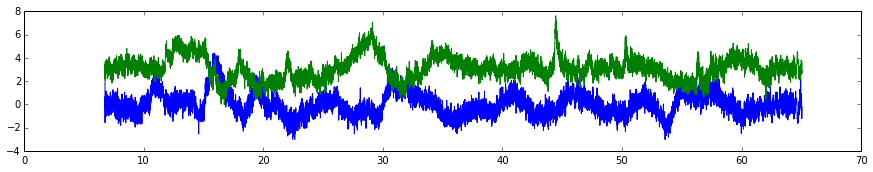


20
NO


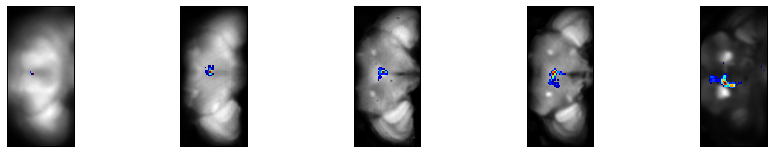

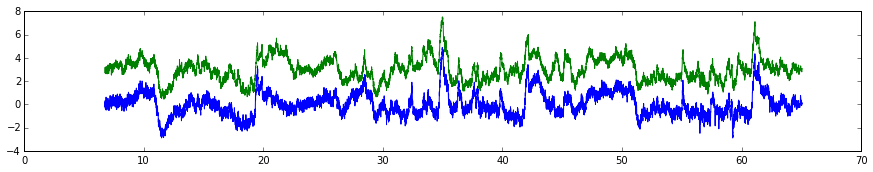

a
21
ME_L


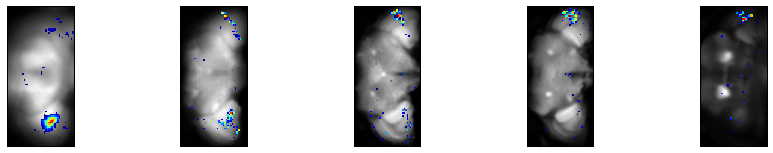

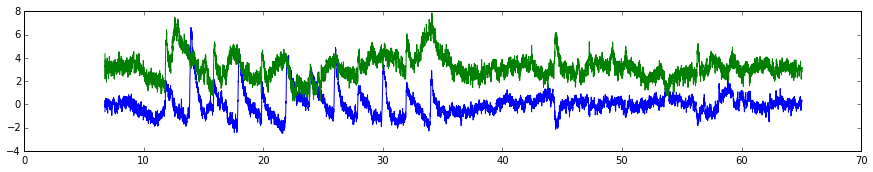

a
22
GNG


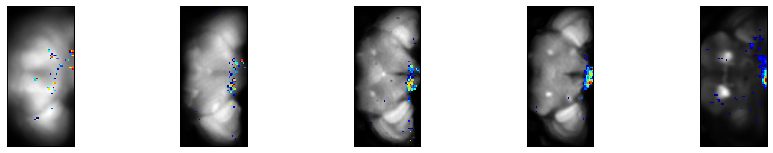

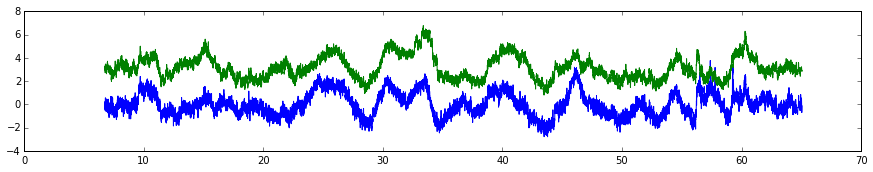


23
IPS_R


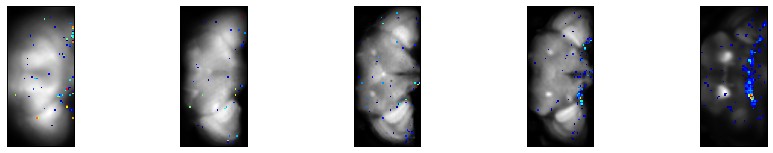

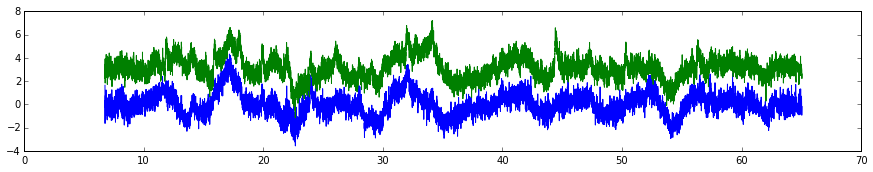


24
NO


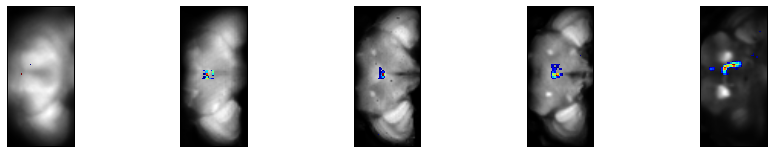

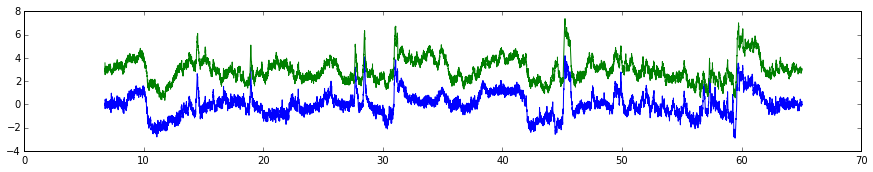

a
25
PRW


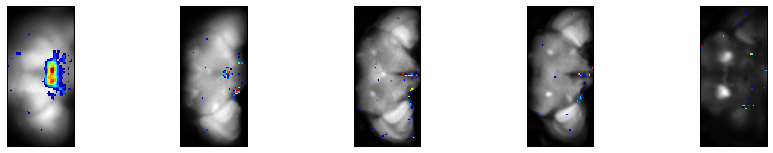

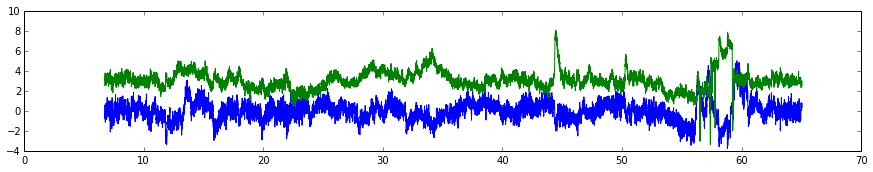


26
AL_R


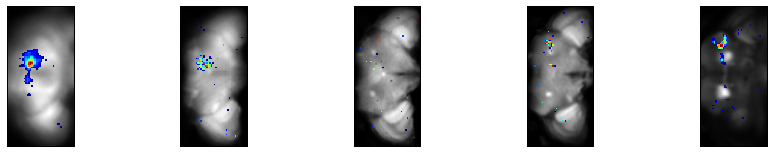

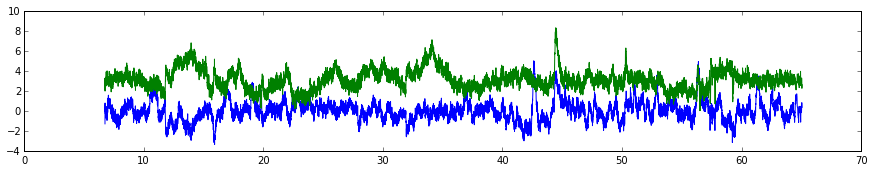

a
27
NO


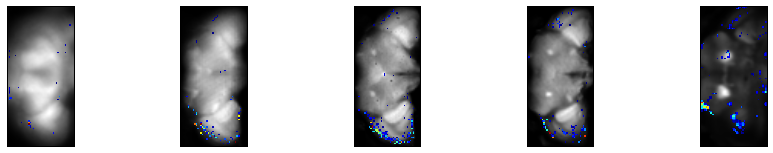

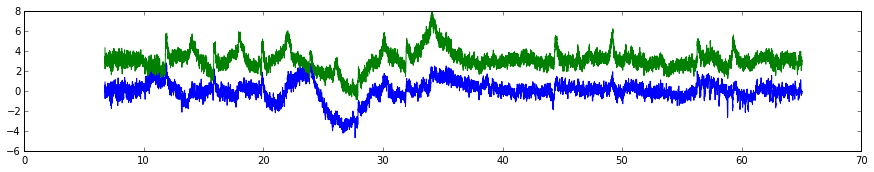


28
LOP_R


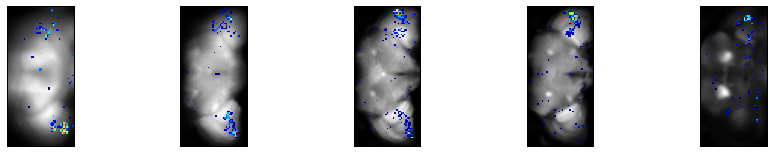

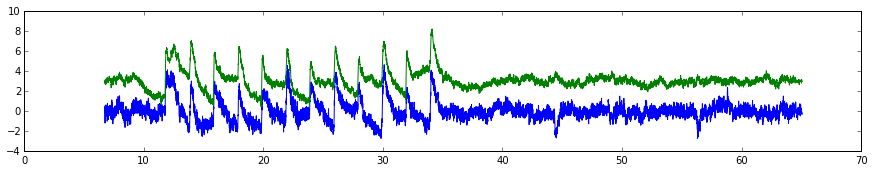

a
29
MB_CA_L


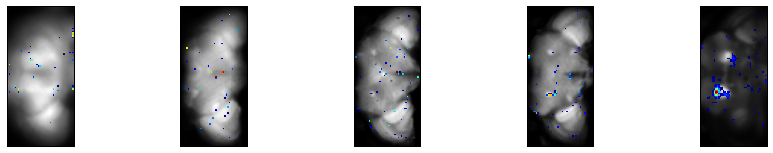

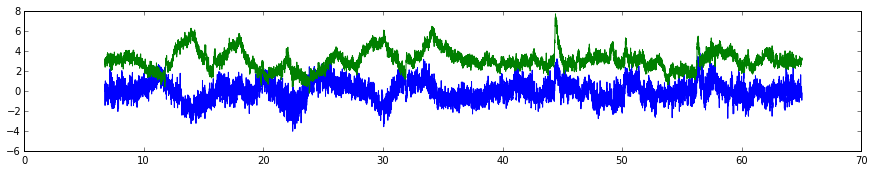


30
ME_L


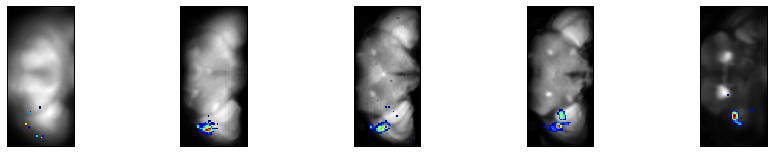

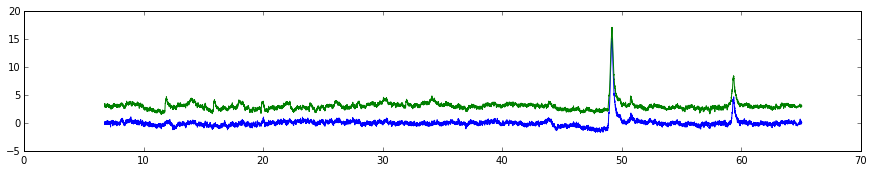

a
31
ME_L


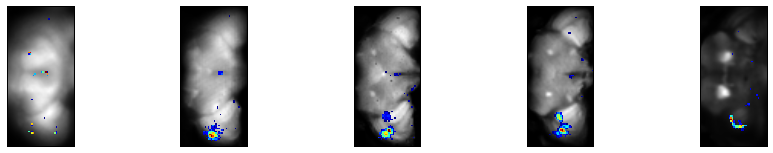

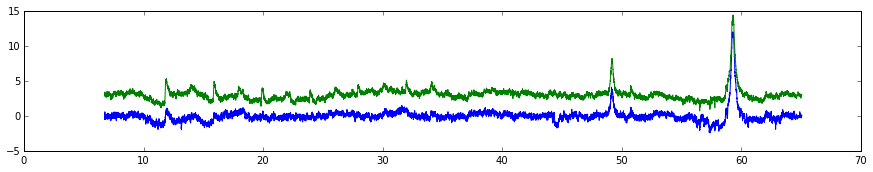

a
32
LO_L


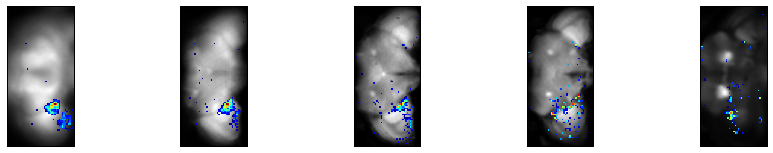

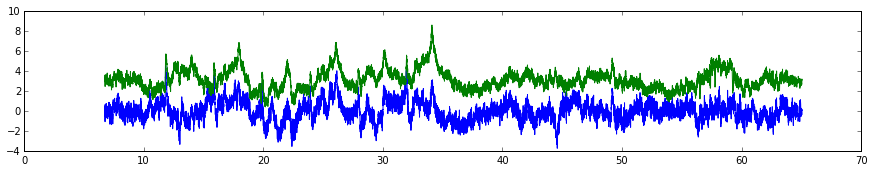

a
33
MB_CA_R


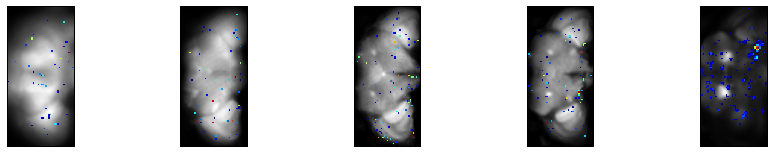

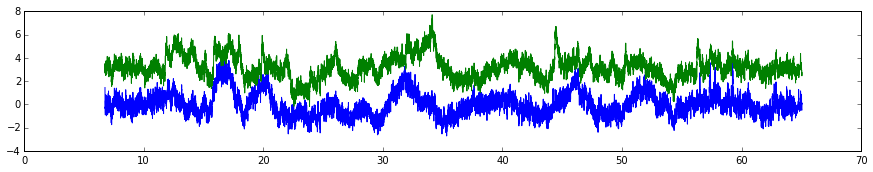


34
AL_L


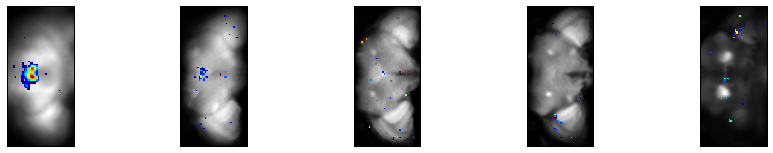

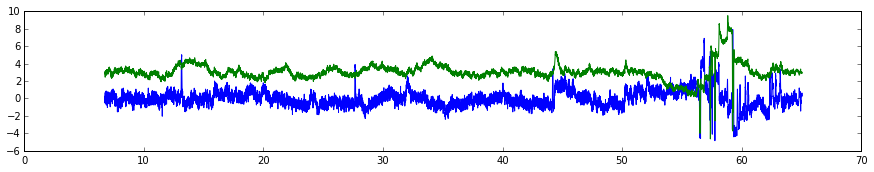


35
AL_L


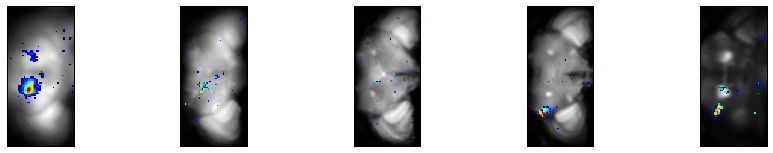

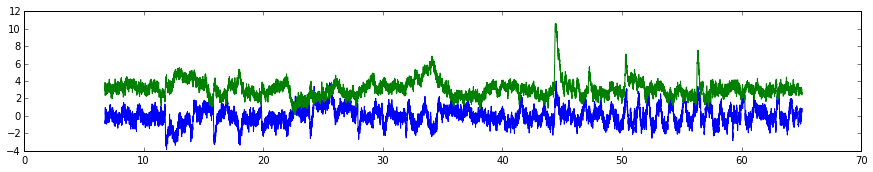

a
36
NO


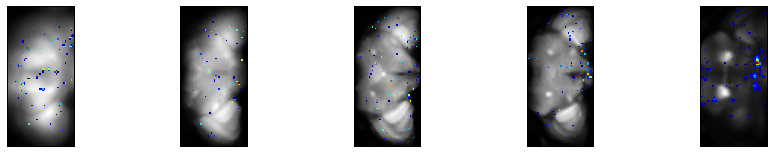

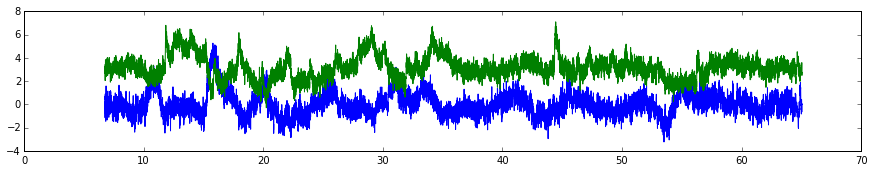


37
PB


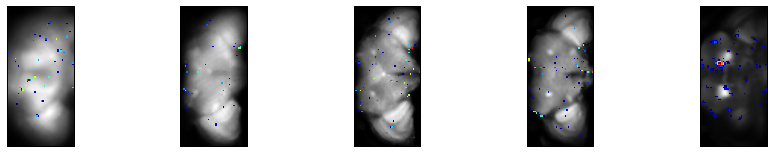

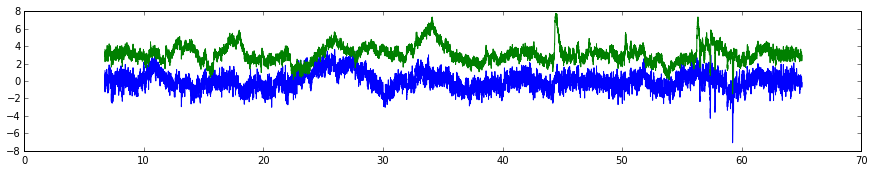


38
AOTU_R


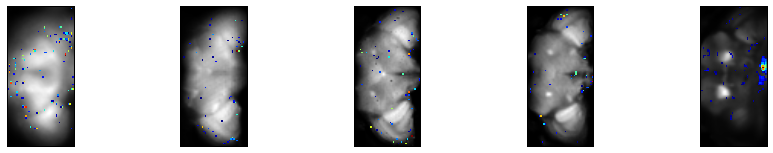

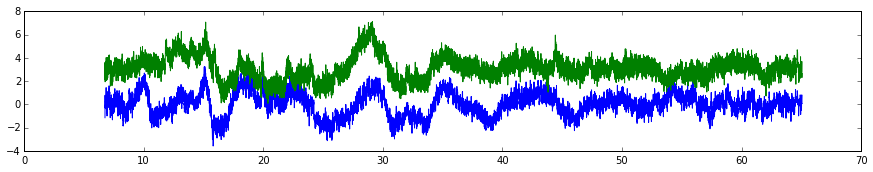


39
ME_R


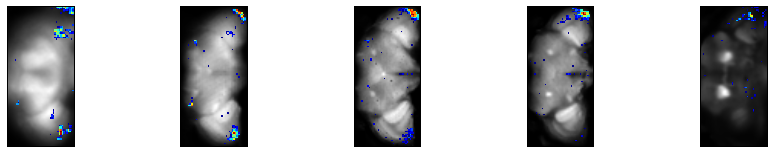

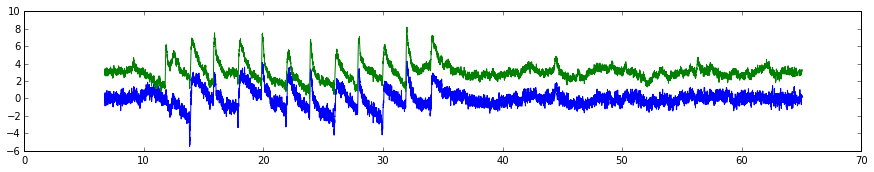


40
SMP_L


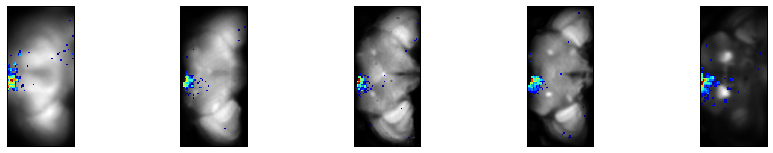

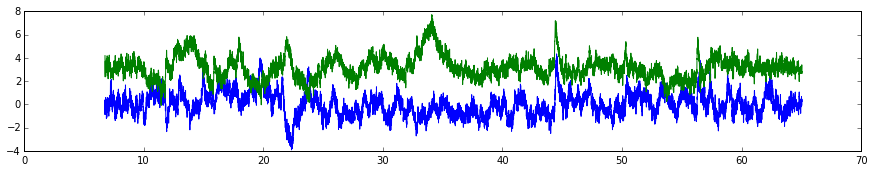

a
41
FLA_L


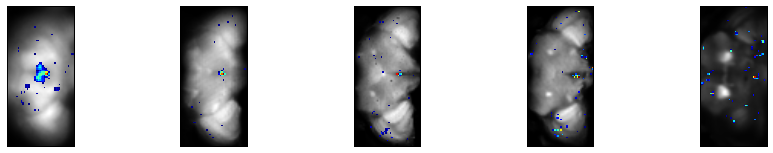

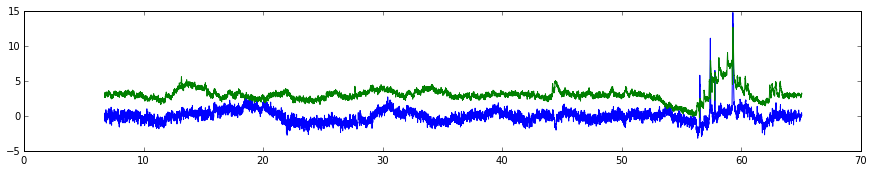


42
MB_CA_R


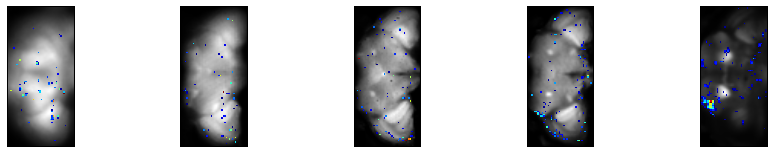

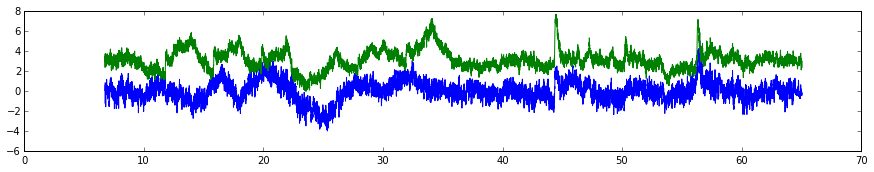


43
MB_CA_L


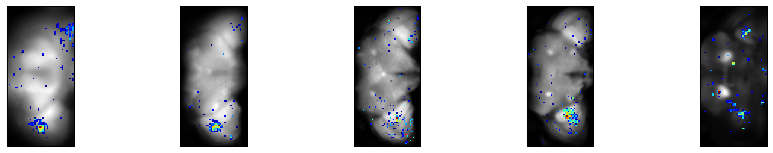

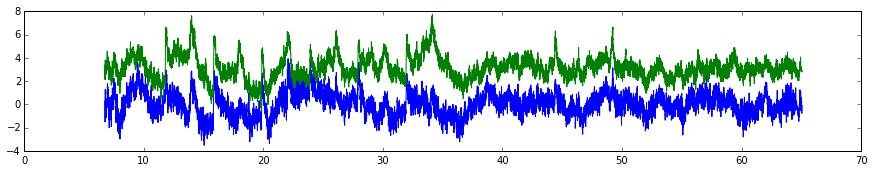


44
MB_CA_R


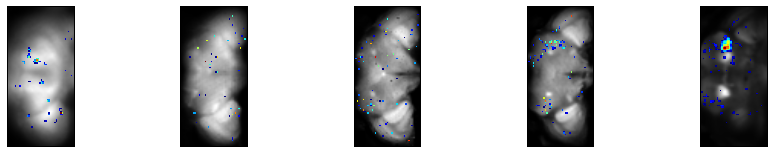

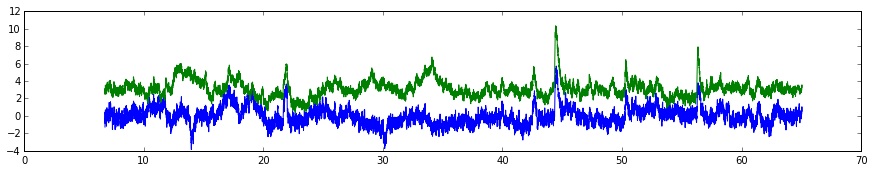

a
45
PB


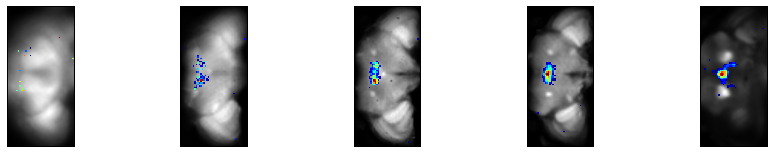

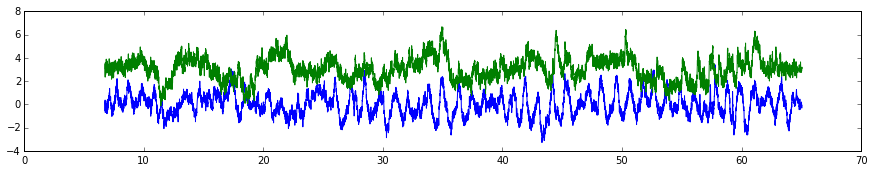

a
46
AL_L


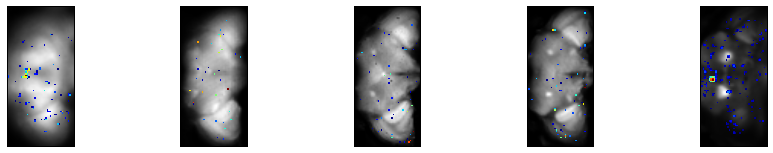

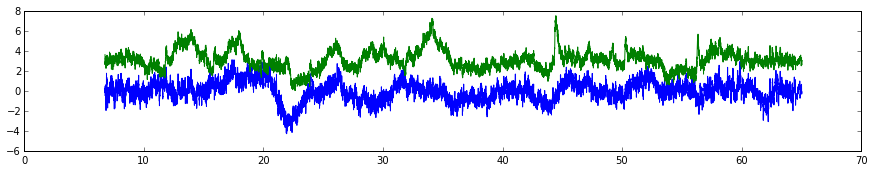


47
IPS_R


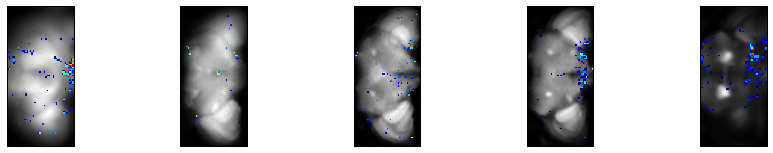

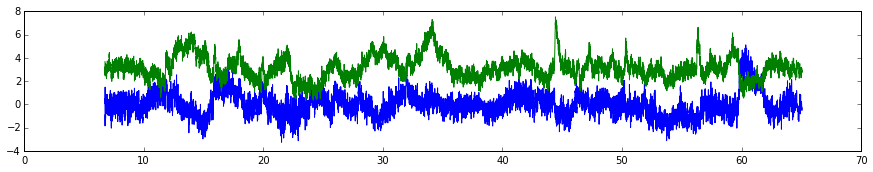


48
IB_L


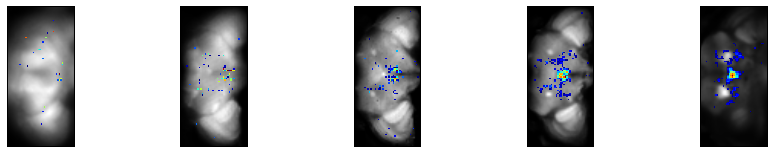

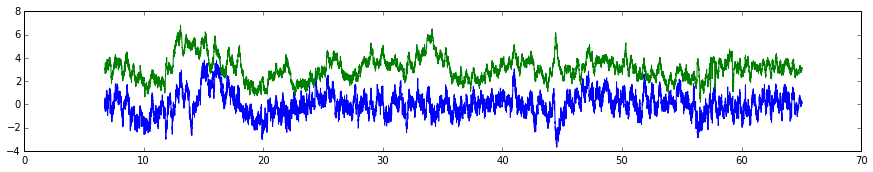

a
49
MB_CA_R


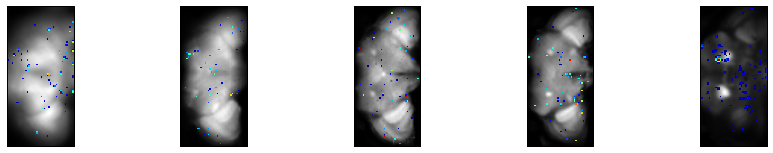

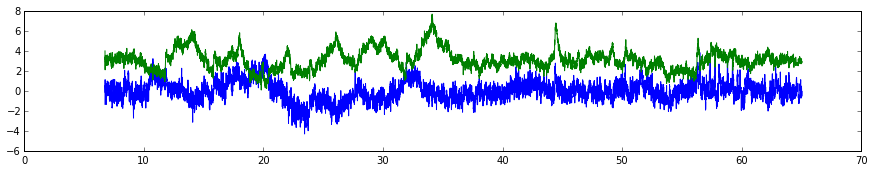


50
MB_CA_R


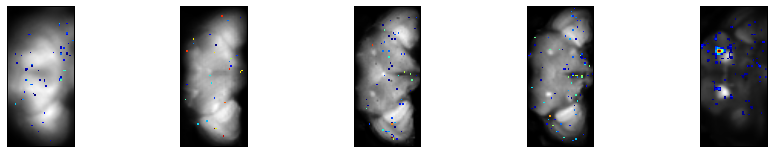

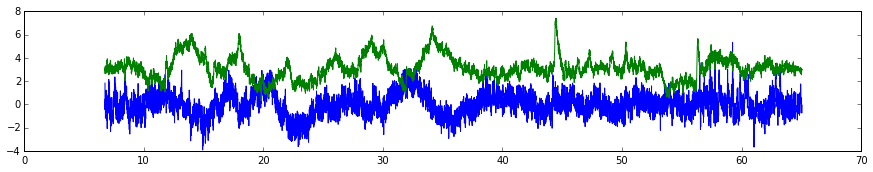


51
MB_CA_R


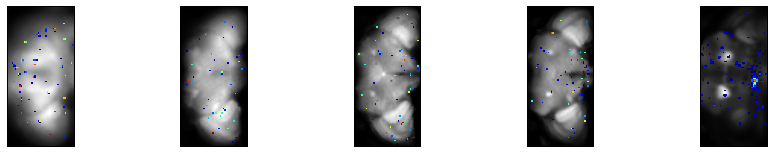

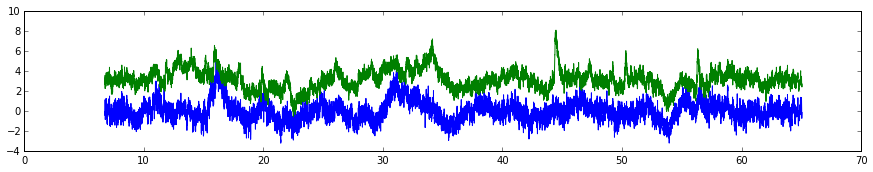


52
SPS_R


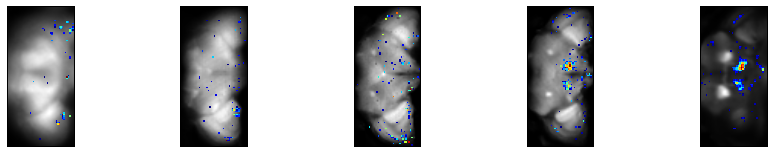

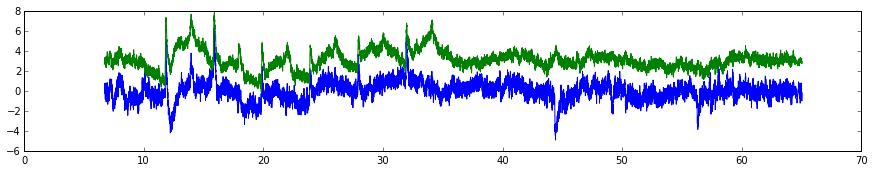

a
53
FLA_L


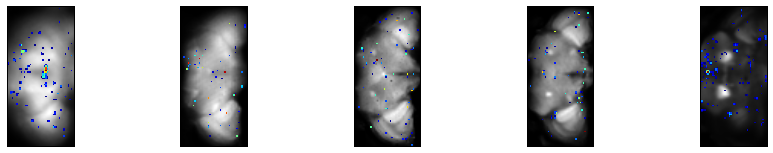

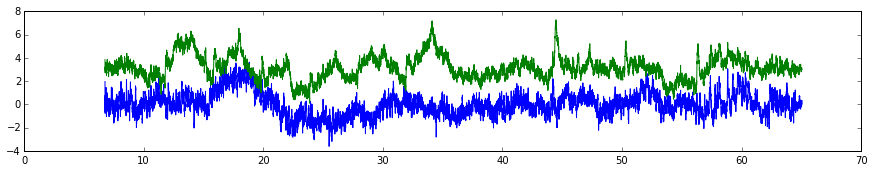


54
MB_CA_L


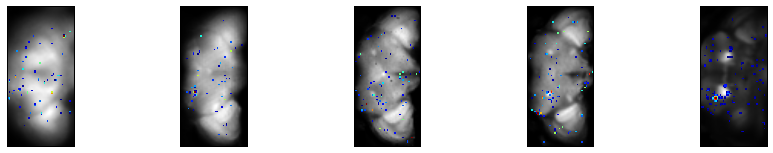

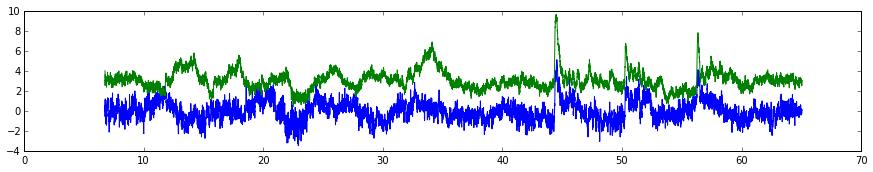

a
55
GNG


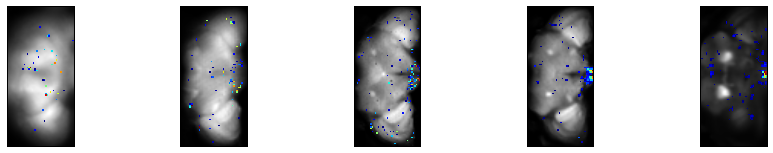

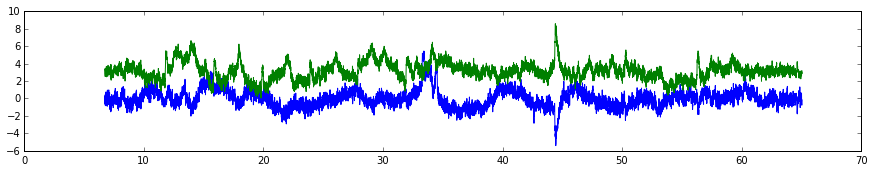


56
ME_L


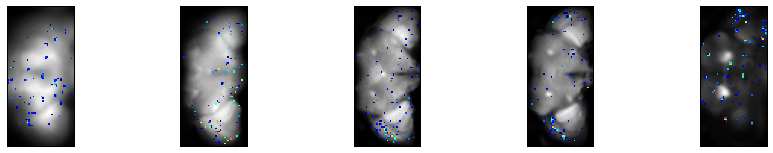

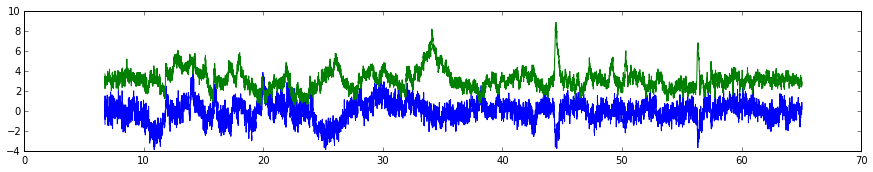


57
MB_CA_L


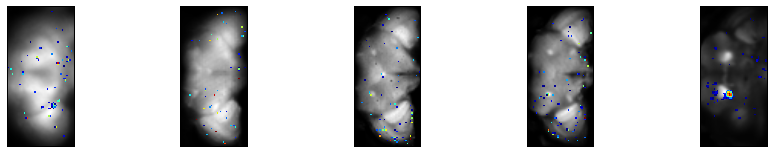

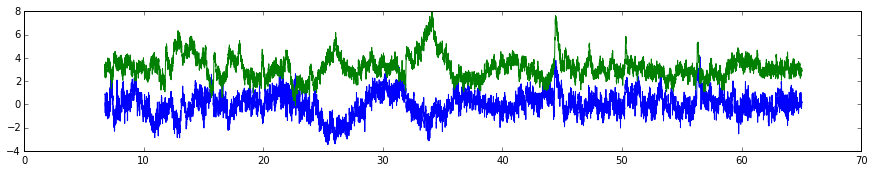


58
MB_CA_L


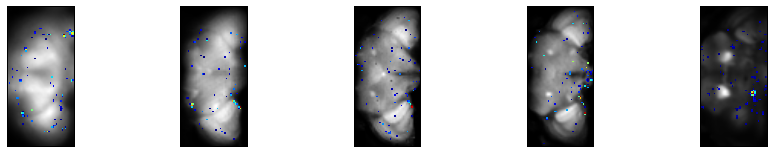

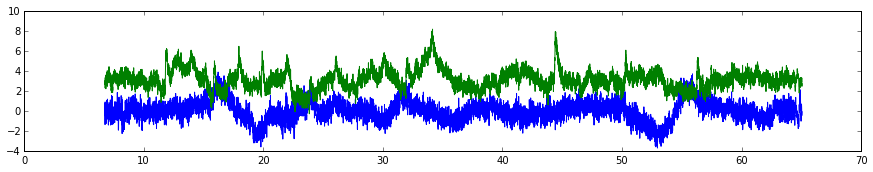


59
FLA_L


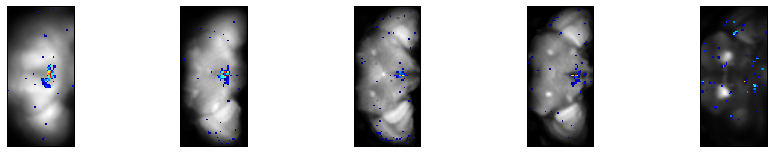

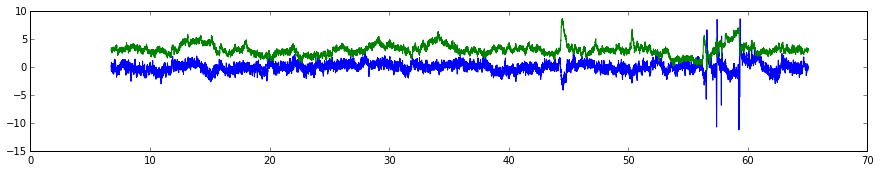


60
IPS_L


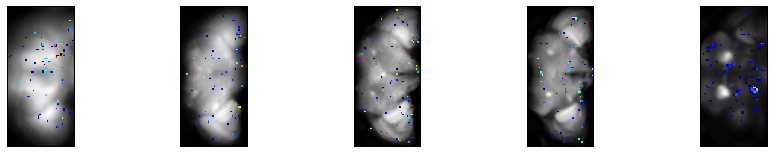

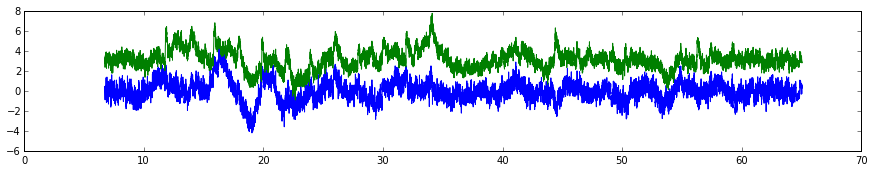


61
MB_CA_L


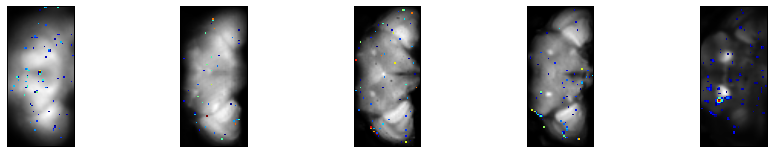

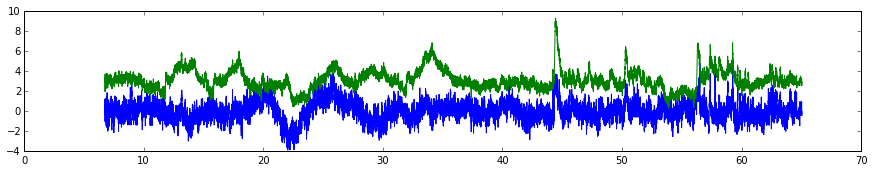


62
MB_PED_L


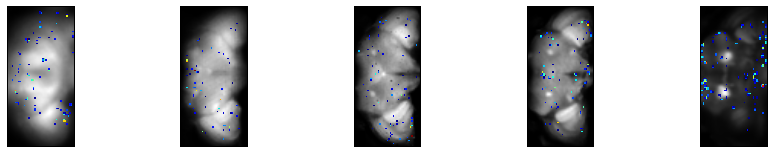

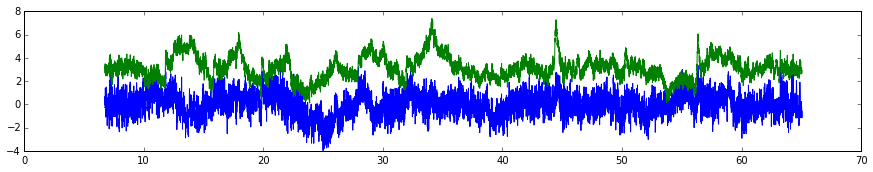


63
IPS_R


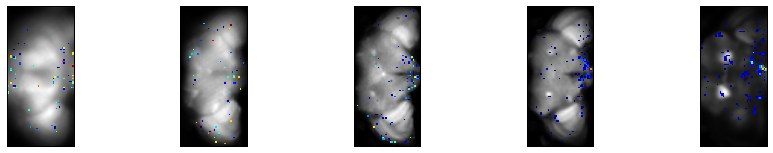

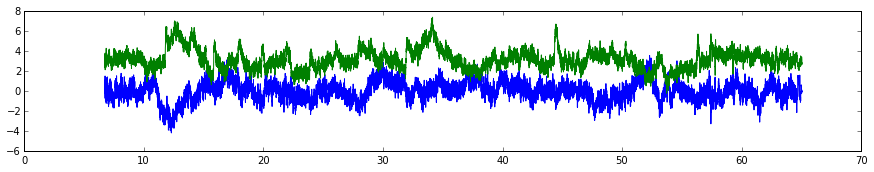


64
AMMC_L


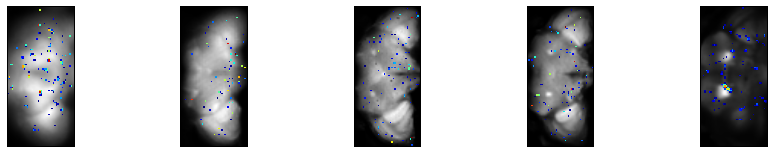

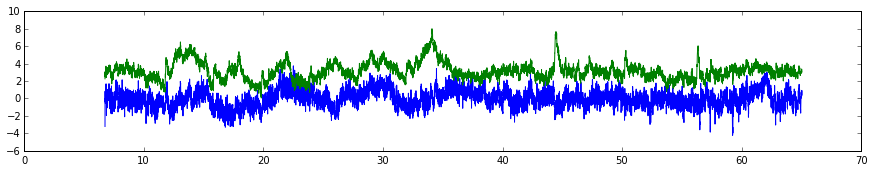


65
ME_R


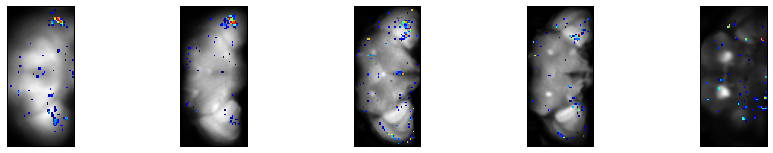

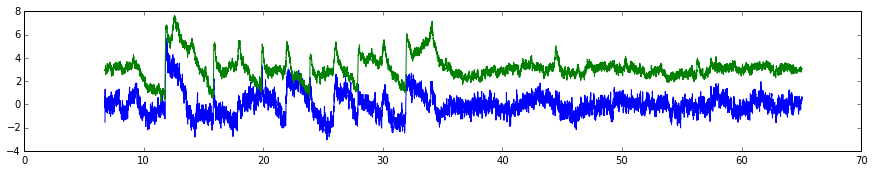

a
66
ME_L


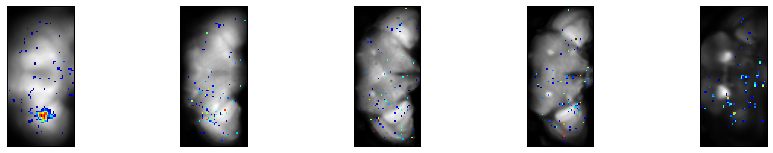

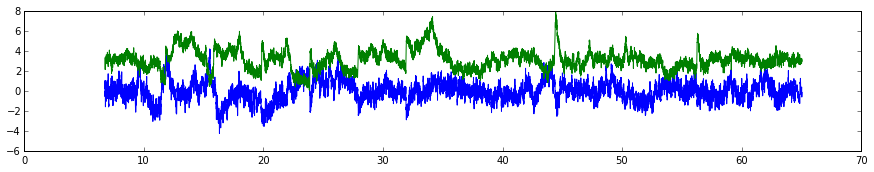


67
MB_VL_R


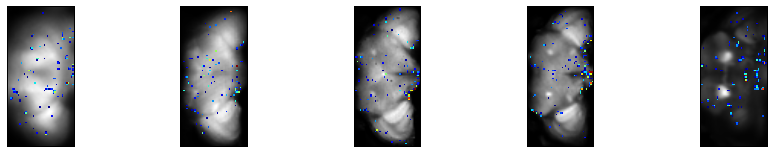

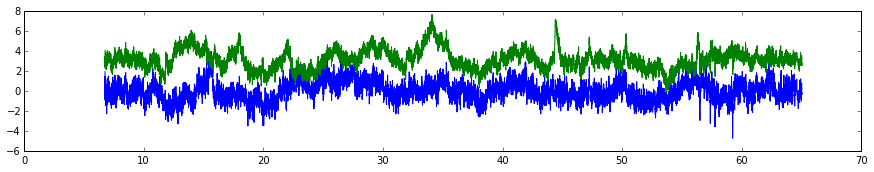


68
MB_ML_L


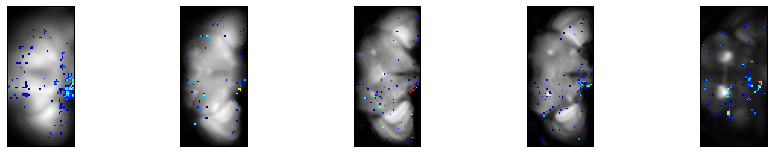

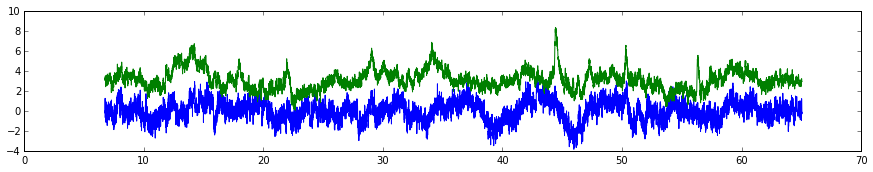


69
ATL_L


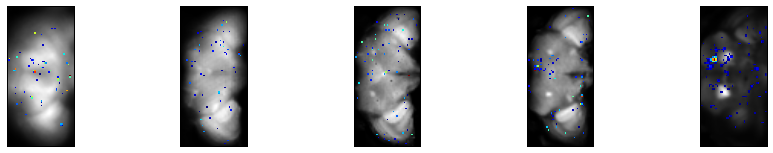

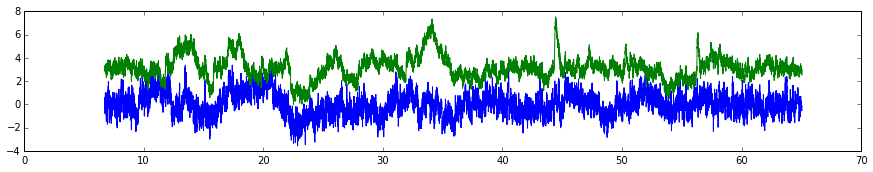


70
MB_CA_R


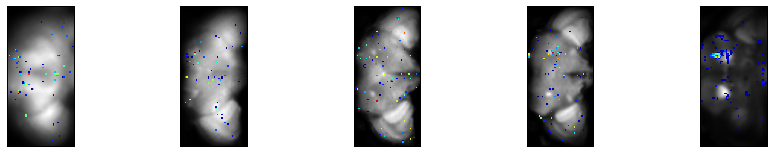

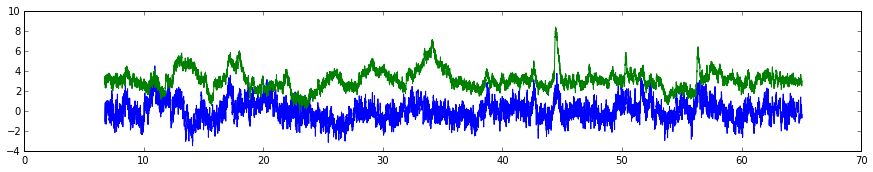


71
NO


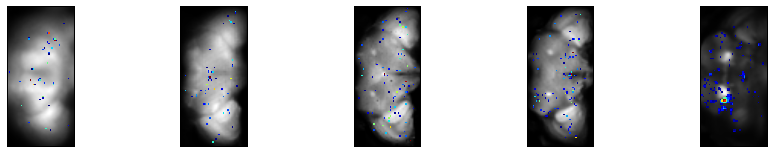

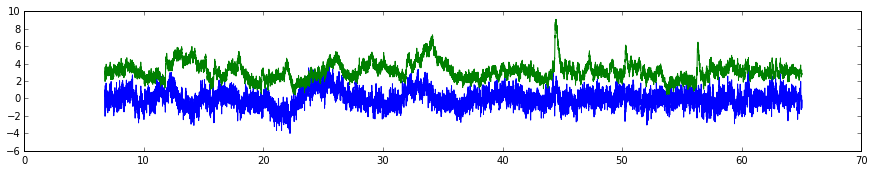


72
MB_CA_L


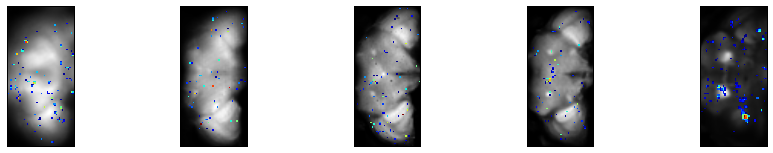

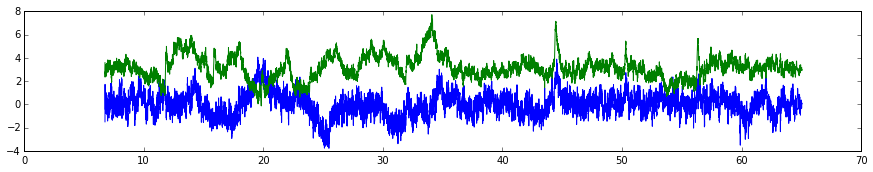


73
PRW


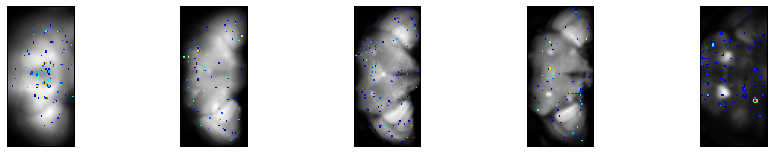

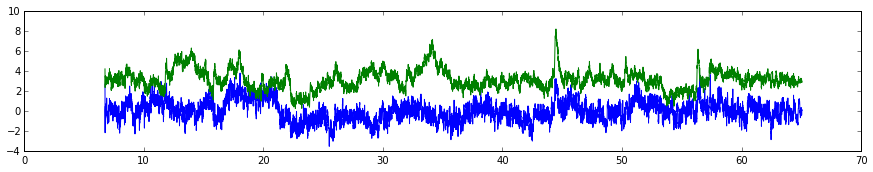


74
MB_CA_R


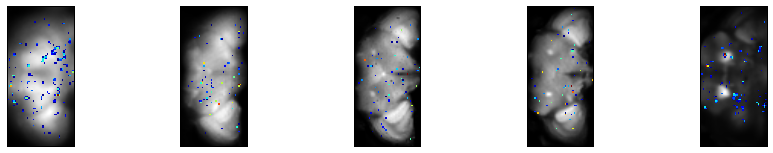

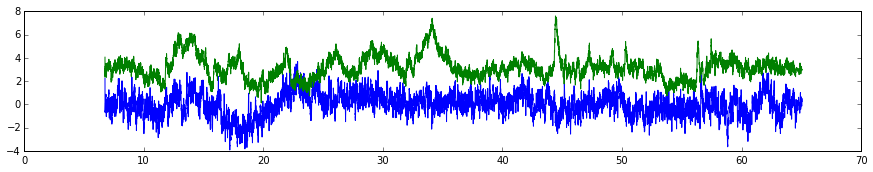


75
CAN_R


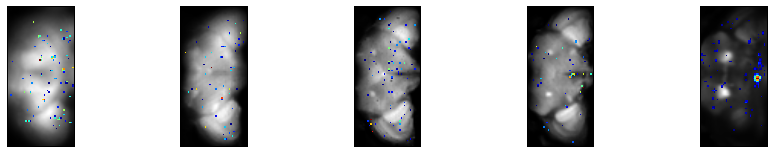

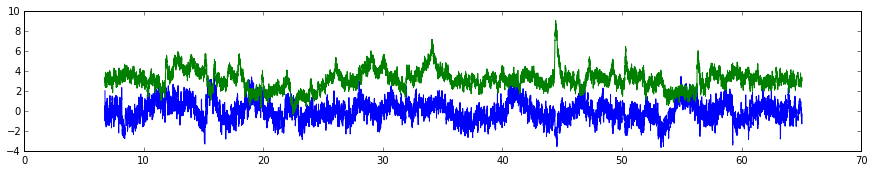


76
MB_CA_R


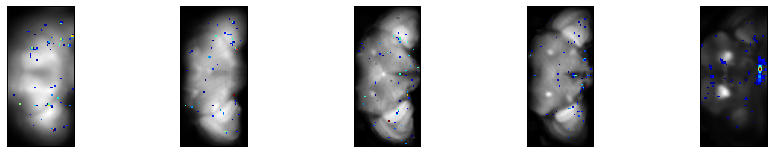

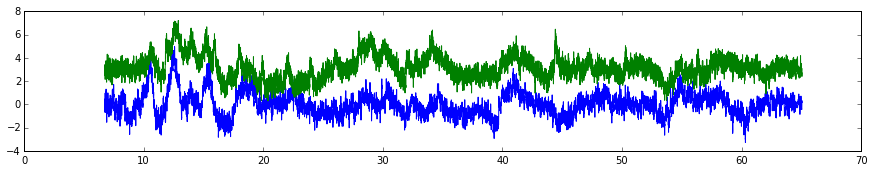


77
MB_CA_R


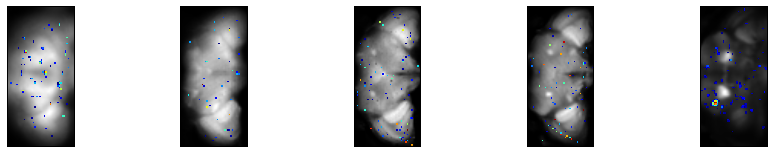

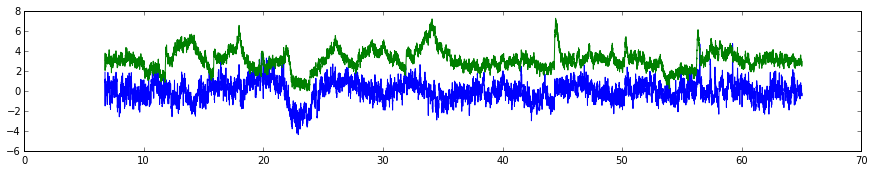


78
SMP_R


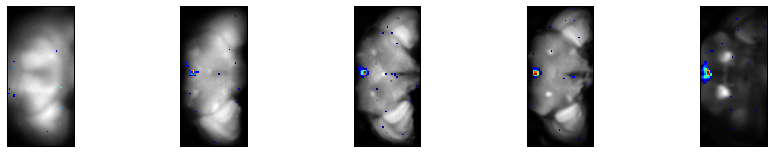

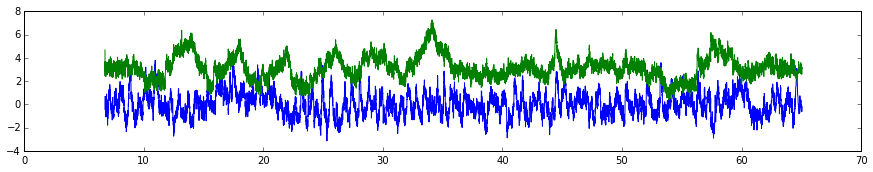

a
79
MB_CA_L


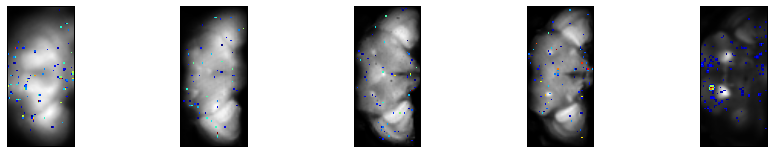

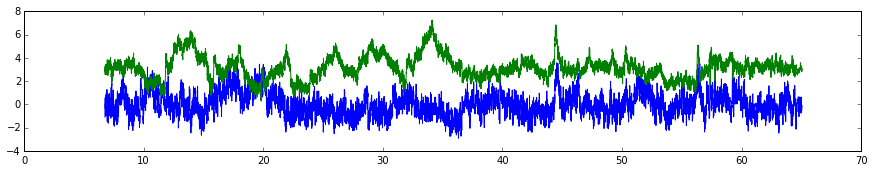


80
SLP_R


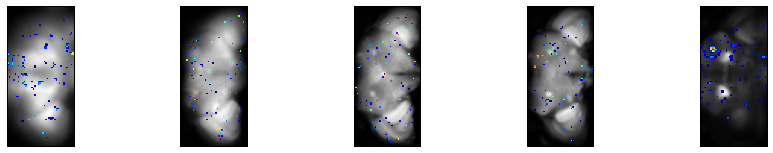

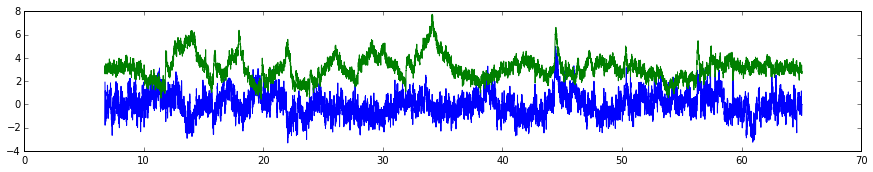


81
MB_CA_L


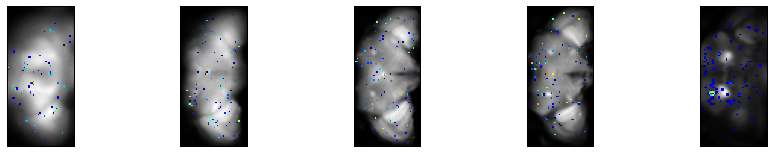

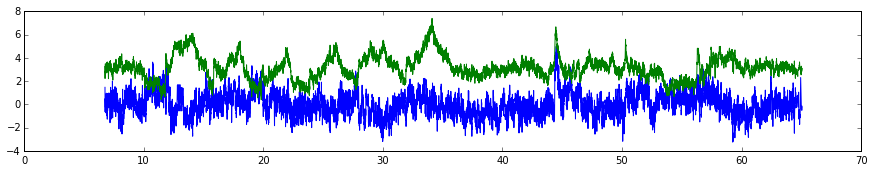


82
MB_CA_L


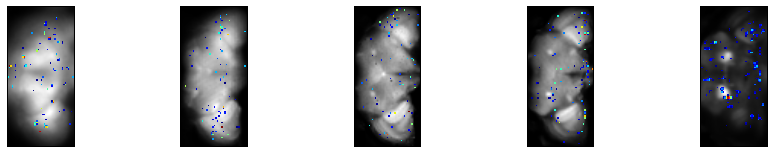

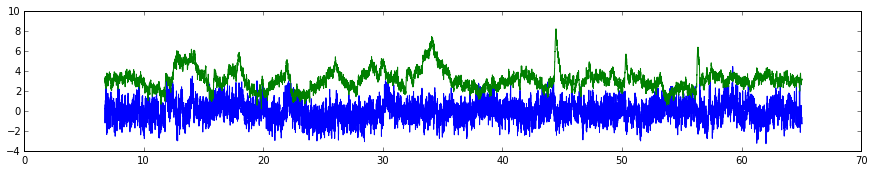


83
PB


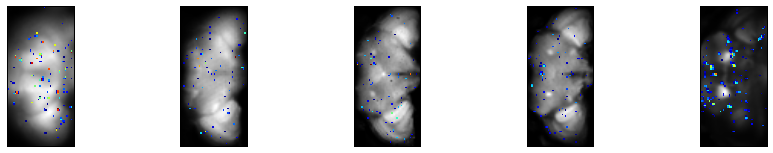

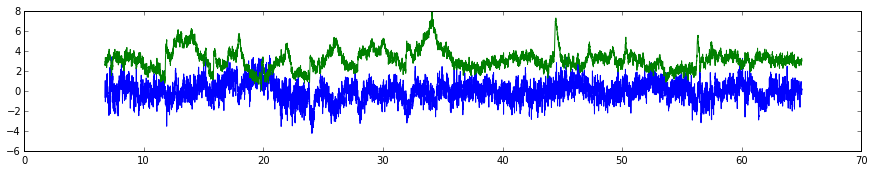


84
MB_CA_L


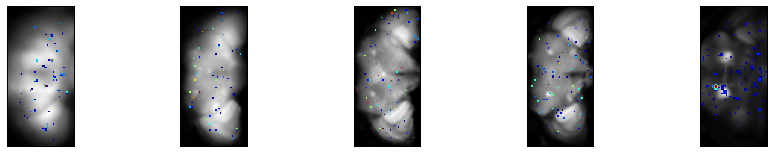

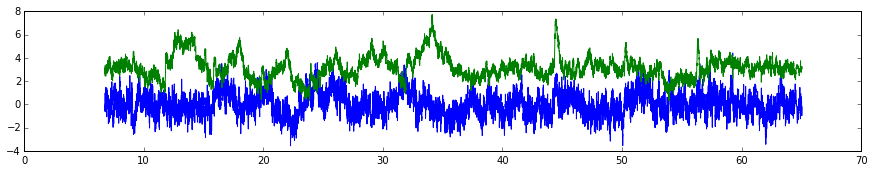


85
SMP_R


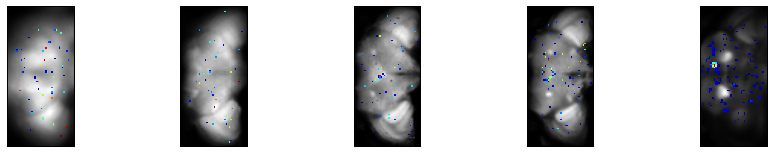

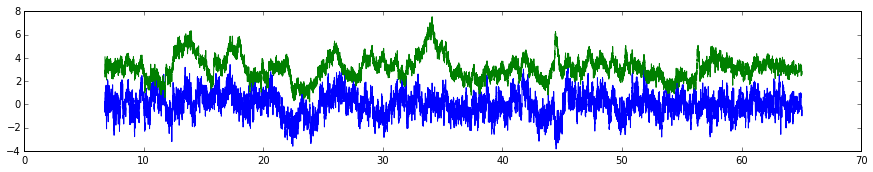


86
ATL_L


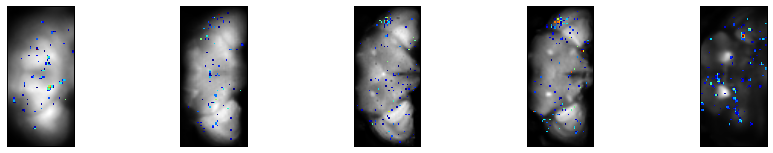

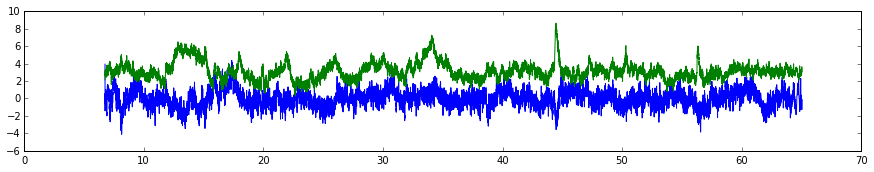


87
LOP_L


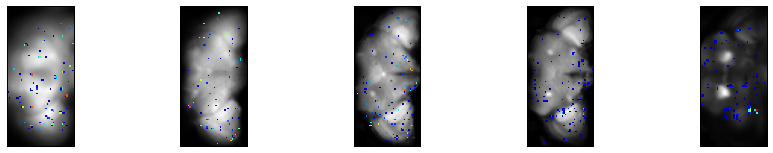

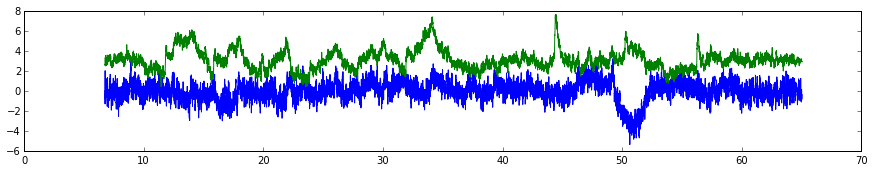


88
ATL_R


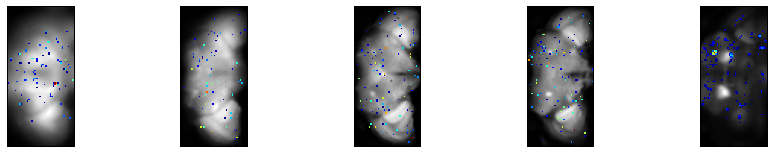

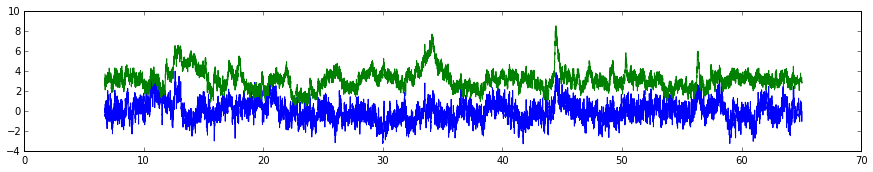


89
MB_CA_R


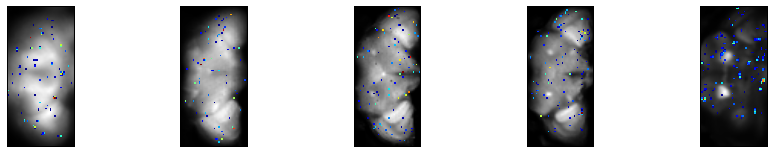

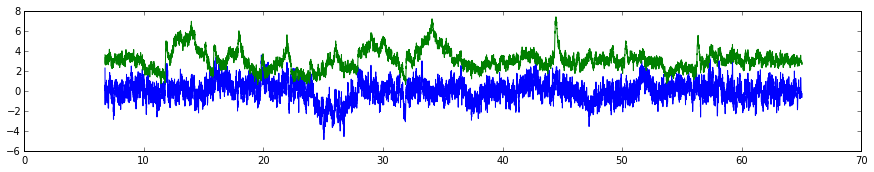


90
AL_R


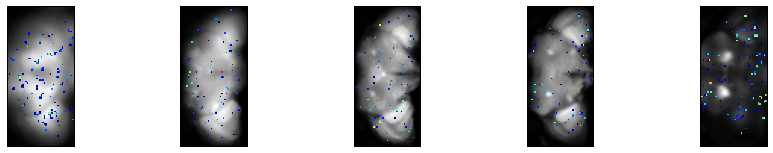

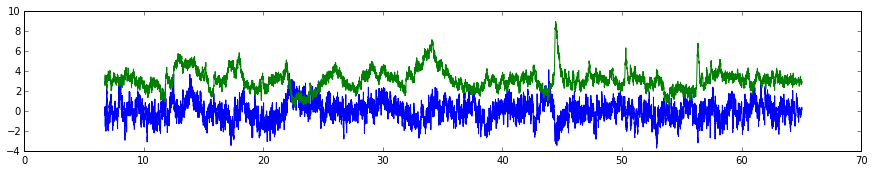


91
AVLP_L


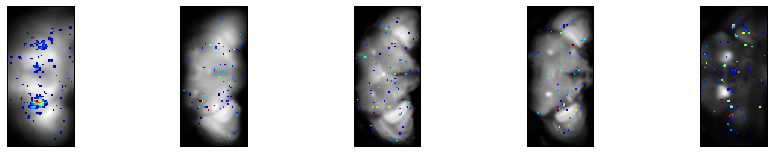

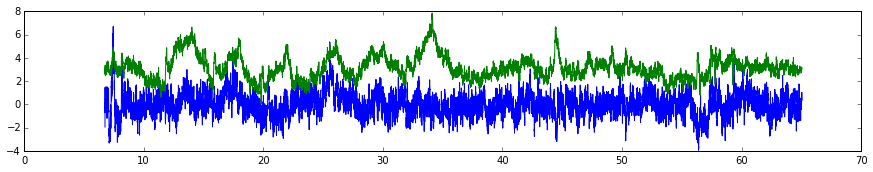


92
PRW


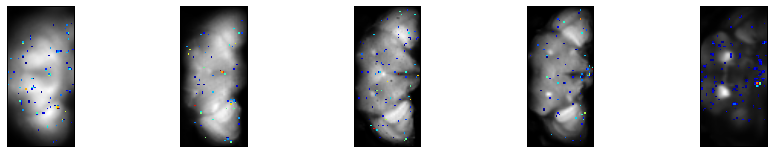

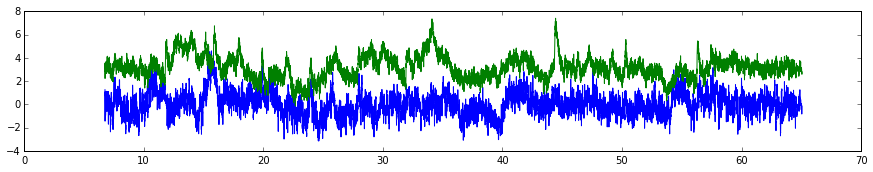


93
MB_CA_L


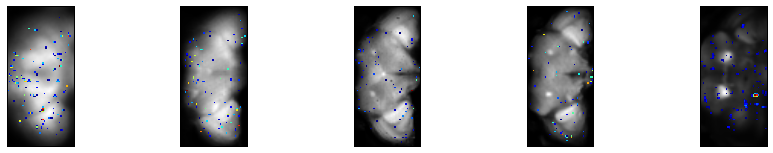

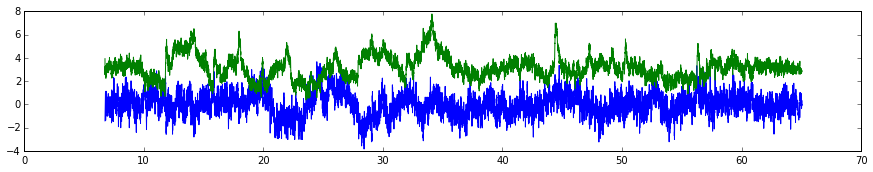


94
PB


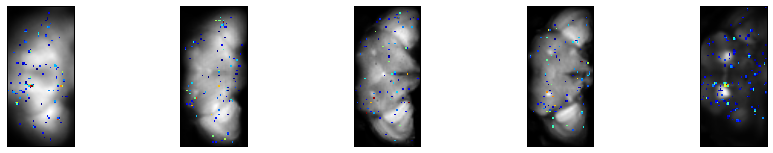

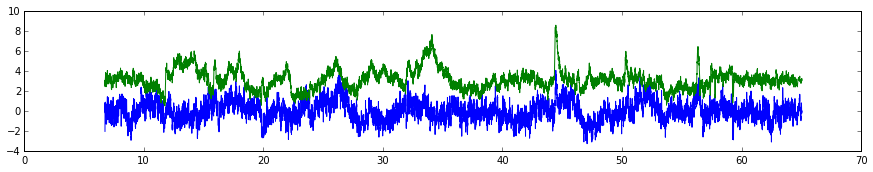


95
CAN_R


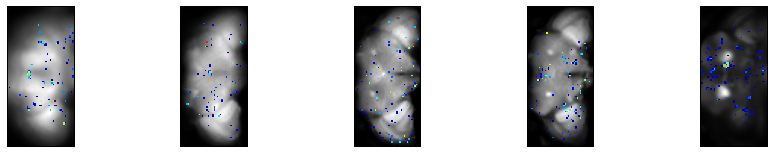

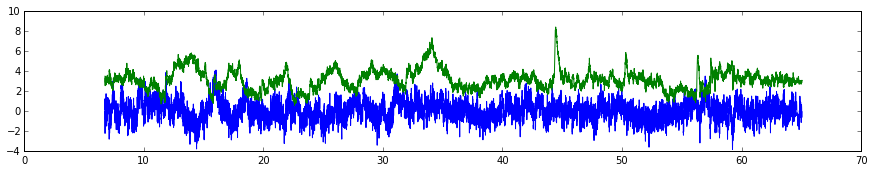


96
MB_CA_L


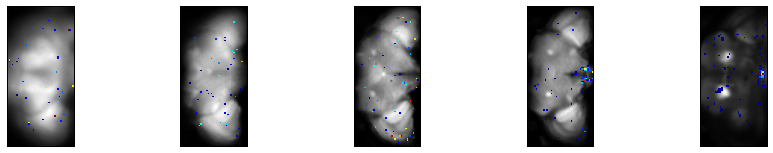

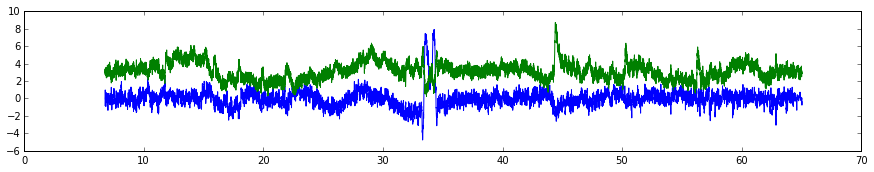


97
FLA_R


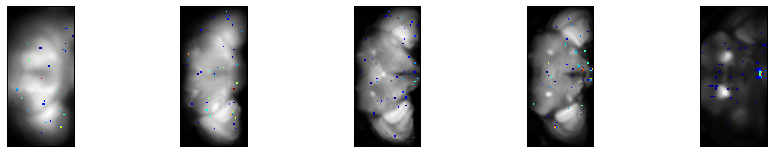

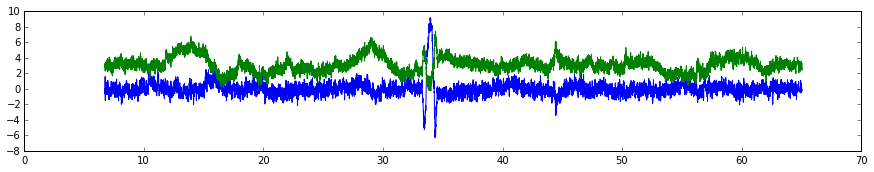


98
CAN_L


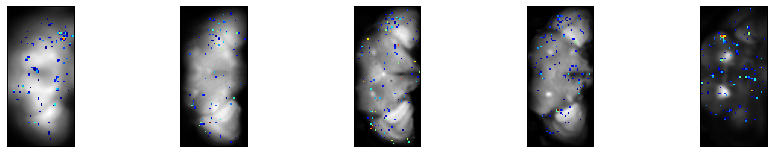

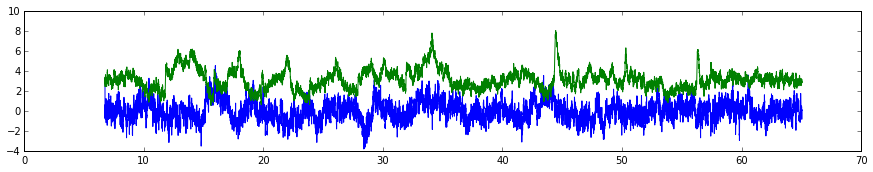


99
MB_CA_L


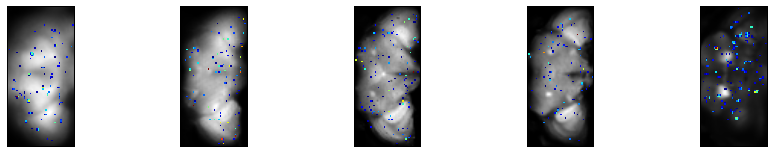

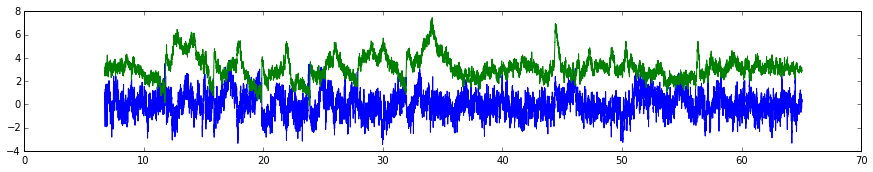


100
CAN_L


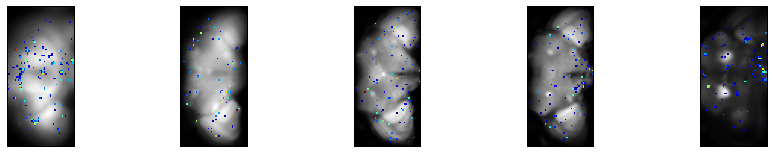

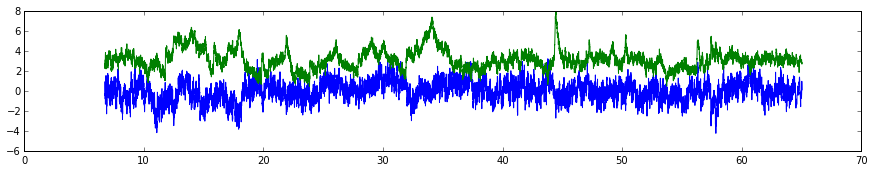


101
ATL_L


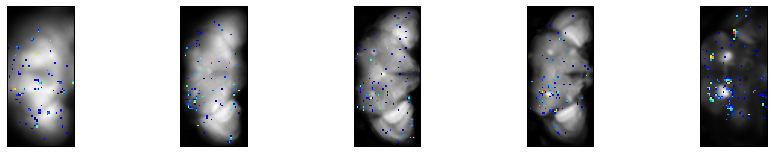

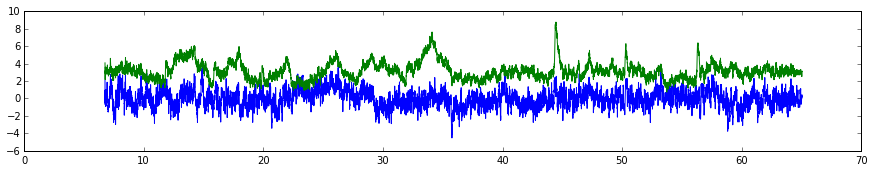


102
EPA_R


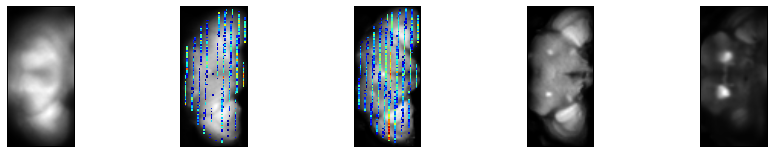

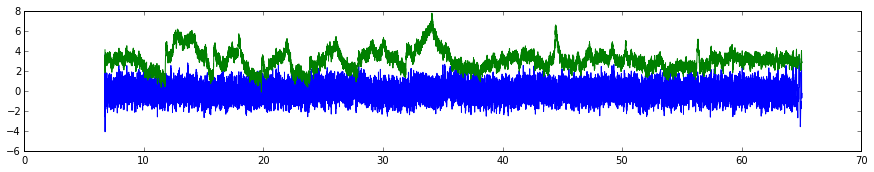


103
PB


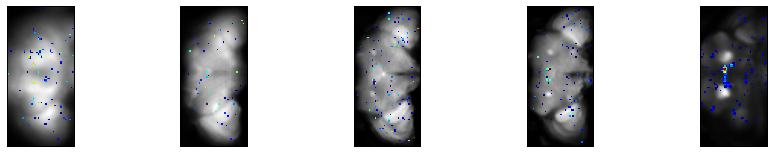

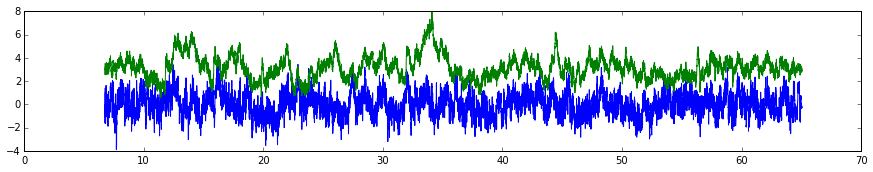

a
104
AME_L


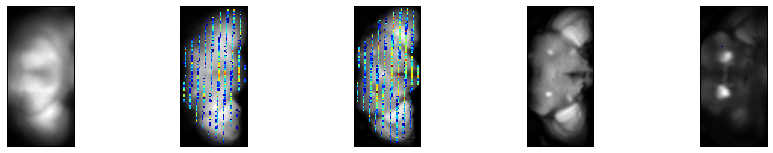

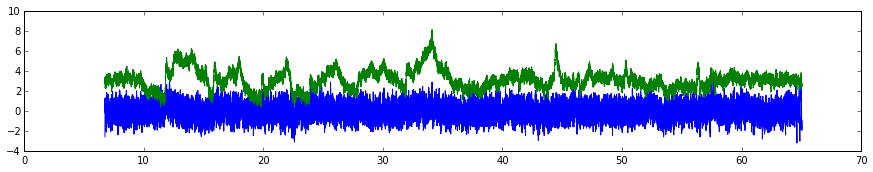


105
ATL_R


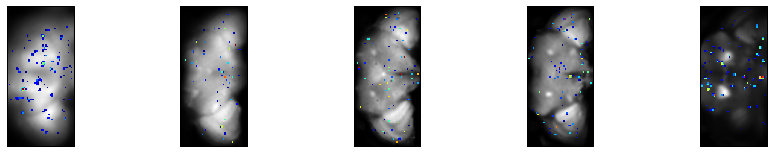

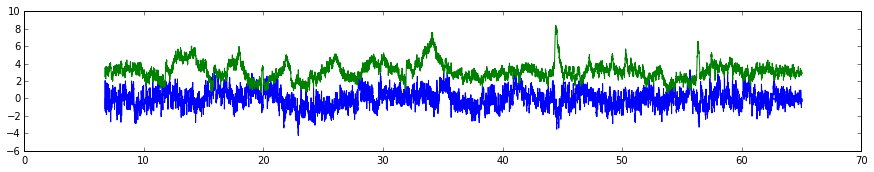


106
MB_CA_L


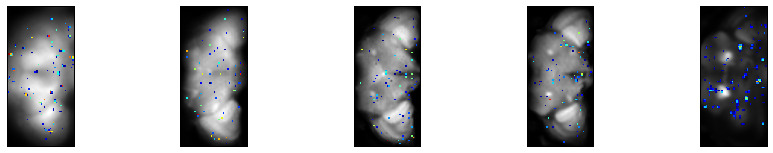

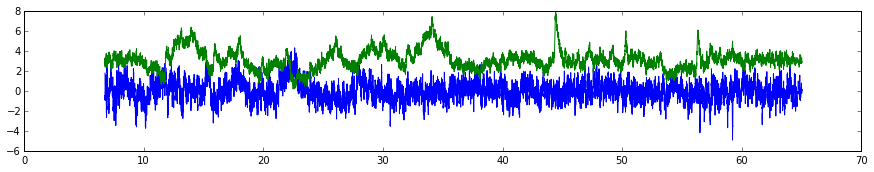


107
NO


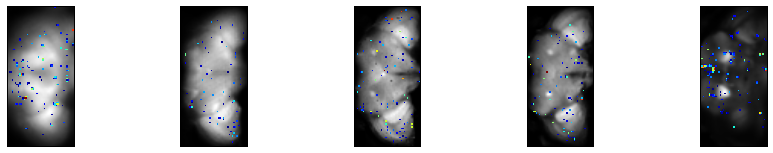

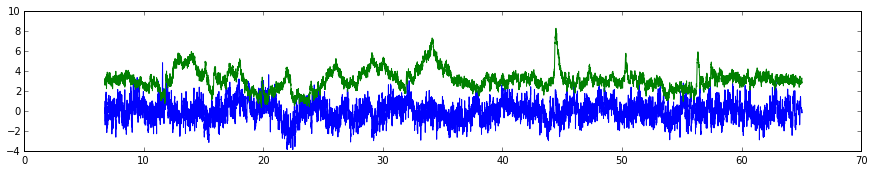

In [29]:
for j in range(S[3]):

    a=''
    if S[2]>5:
        for i in range(Nstack):
            V=Dmaps[:,:,Indices[i],j]
            D1[:,:,i]=np.max(V,2)
        D2[:,:,:,j]=D1
        D1[D1==0]=np.nan
           
    else:
        for i in range(S[2]):
            V=Dmaps[:,:,i,Order[j]]
            D1[:,:,i]=V 

    if CompMainName[j] != '':
        print(j)
        print(CompMainName[j])
        for i in range(Nstack):
            plt.subplot(1,5,i+1)
            plt.imshow(Dmean[:,:,i],cmap=plt.cm.gray)
            plt.imshow(D1[:,:,i], cmap=my_cmap,interpolation='none')
            frame1 = plt.gca()
            frame1.axes.get_xaxis().set_visible(False)
            frame1.axes.get_yaxis().set_visible(False)
        
        plt.show()
        
        plt.plot(Time_fluoICA,DT[:,j]/np.sqrt(np.var(DT[:,j])))
        plt.plot(Time_fluoICA,DTroi[:,j]/np.sqrt(np.var(DTroi[:,j]))+3)        
        plt.show()
        a=raw_input()
    
    Label_ICs.append(a)
    if Label_ICs[j]!='':
        Good_ICs[j]=1

In [30]:
fn=open('/home/sophie/Desktop/100051GoodICs150.txt','w')
for i in range(S[3]):
    if Good_ICs[i]:
        print>>fn, i
        print>>fn, CompMainName[i]
        print>>fn, Good_ICs[i]

In [31]:
if len(Label_ICs)<S[3]:
    for j in range(S[3]-len(Label_ICs)):
      Label_ICs.append('')  

In [32]:
G=Good_ICs.tolist();

In [33]:
len(Good_ICs)

108

In [34]:
G.count(1)

24

# Reorder by larger sub-regions (~ presumed stimulus to motor)

In [35]:
LargerRegionsDic={'':'','AME_R':'OL','LO_R':'OL','NO':'CX','BU_R':'CX','PB':'CX','LH_R':'LH','LAL_R':'LX','SAD':'PENP'
               ,'CAN_R':'PENP','AMMC_R':'PENP','ICL_R':'INP','VES_R':'VMNP','IB_R':'INP','ATL_R':'INP','CRE_R':'INP'
               ,'MB_PED_R':'MB','MB_VL_R':'MB','MB_ML_R':'MB','FLA_R':'PENP','LOP_R':'OL','EB':'CX','AL_R':'AL',
                'ME_R':'OL','FB':'CX','SLP_R':'SNP','SIP_R':'SNP','SMP_R':'SNP','AVLP_R':'VLNP','PVLP_R':'VLNP',
                'IVLP_R':'VLNP','PLP_R':'VLNP','AOTU_R':'VLNP','GOR_R':'VMNP','MB_CA_R':'MB','SPS_R':'VMNP',
                'IPS_R':'VMNP','SCL_R':'INP','EPA_R':'VMNP','GNG':'GNG','PRW':'PENP','GA_R':'LX','AME_L':'OL'
                ,'LO_L':'OL','BU_L':'CX','LH_L':'LH','LAL_L':'LX','CAN_L':'PENP','AMMC_L':'PENP','ICL_L':'INP',
                'VES_L':'VMNP','IB_L':'INP','ATL_L':'INP','CRE_L':'INP','MB_PED_L':'MB','MB_VL_L':'MB',
                'MB_ML_L':'MB','FLA_L':'PENP','LOP_L':'OL','AL_L':'AL','ME_L':'OL','SLP_L':'SNP','SIP_L':'SNP',
                'SMP_L':'SNP','AVLP_L':'VLNP','PVLP_L':'VLNP','IVLP_L':'VLNP','PLP_L':'VLNP','AOTU_L':'VLNP',
                'GOR_L':'VMNP','MB_CA_L':'MB','SPS_L':'VMNP','IPS_L':'VMNP','SCL_L':'INP','EPA_L':'VMNP','GA_L':'LX'}

In [36]:
SmallRegionsSorted=['ME_L','ME_R','LO_R','LO_L','LOP_R','LOP_L','AME_R','AME_L',
                  'PLP_R','PLP_L','PVLP_R','PVLP_L','AVLP_R','AVLP_L','AOTU_R','AOTU_L','IVLP_R','IVLP_L',
                  'AL_R','AL_L',
                  'MB_CA_R','MB_CA_L','MB_PED_R','MB_PED_L','MB_VL_R','MB_VL_L','MB_ML_R','MB_ML_L',
                  'SMP_R','SMP_L','SIP_R','SLP_L','SLP_R','SIP_L',
                  'LH_R','LH_L',                  
                  'CRE_R','CRE_L','ICL_R','ICL_L','SCL_R','SCL_L','IB_R','IB_L','ATL_R','ATL_L',
                  'EB','PB','NO','FB',
                  'BU_R','BU_L','LAL_R','LAL_L','GA_R','GA_L',
                  'GOR_R','GOR_L','EPA_R','EPA_L','VES_R','VES_L','SPS_R','SPS_L','IPS_R','IPS_L',
                  'AMMC_R','AMMC_L','SAD','FLA_R','FLA_L','PRW','CAN_R','CAN_L',
                  'GNG','']

In [37]:
Tozip=range(len(SmallRegionsSorted))
SmallRegionsDic=dict(zip(SmallRegionsSorted,Tozip))

In [38]:
LargerRegion=[LargerRegionsDic[CompMainName[i]] for i in range(S[3])]

In [39]:
LargerRegionInd={ 'OL':1,'VLNP':2,'VMNP':3,'AL':4,'MB':5,'LH':6,'SNP':7,'CX':8,'LX':9,'INP':10,'PENP':11,'GNG':12,'':13}

In [40]:
LargerRegionI=np.array([LargerRegionInd[LargerRegion[i]] for i in range(S[3])])

In [41]:
SmallRegion=np.array([SmallRegionsDic[CompMainName[i]] for i in range(S[3])])

In [42]:
NewOrder=np.argsort(SmallRegion)

In [43]:
SmallRegion[NewOrder]

array([ 0,  0,  0,  0,  0,  0,  1,  1,  1,  2,  3,  4,  5,  5,  5,  7, 13,
       14, 18, 18, 19, 19, 19, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20,
       20, 20, 20, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21,
       21, 21, 21, 21, 23, 24, 24, 27, 28, 28, 29, 32, 34, 35, 35, 43, 44,
       44, 45, 45, 45, 47, 47, 47, 47, 47, 47, 48, 48, 48, 48, 48, 48, 58,
       62, 64, 64, 64, 64, 65, 65, 65, 67, 69, 70, 70, 70, 70, 71, 71, 71,
       72, 72, 73, 73, 74, 74])

# Plot all components together

In [191]:
if S[2]>5:
    Final_map=np.zeros([S[0],S[1],5,3])
    Fmaps=np.zeros([S[0],S[1],5,3])
else:
    Final_map=np.zeros([S[0],S[1],3]) 
    Fmaps=np.zeros([S[0],S[1],3])    
C=np.zeros([S[3],3])

In [192]:
C1=np.zeros([6,3])
C1[0][:]=(1,0,0)
C1[1][:]=(0,1,0)
C1[2][:]=(0,0,1)
C1[3][:]=(0.8,0.8,0)
C1[4][:]=(0,1,1)
C1[5][:]=(1,0,1)
S1=DT.shape

In [193]:
GoodICo=Good_ICs[NewOrder]
D2o=D2[:,:,:,NewOrder]
LargerRegionIo=LargerRegionI[NewOrder]
Ind=np.array(range(S[3]))
Indexo=Ind[NewOrder]
DTo=DT[:,NewOrder]

In [194]:
C=np.zeros((S[3],3))
i=0
for j in range(S[3]):  
    if LargerRegionIo[j]<12 and GoodICo[j]:
        C[j,:]=C1[i%6][:]
        for k in range(3):           
            M=np.max(np.squeeze(np.reshape(D2o[:,:,:,j],S[0]*S[1]*5)))
            Fmaps[:,:,:,k]=0.6*D2o[:,:,:,j]*C[j,k]/M
        Final_map=Final_map+Fmaps
        #print(Indexo[j])
        i=i+1

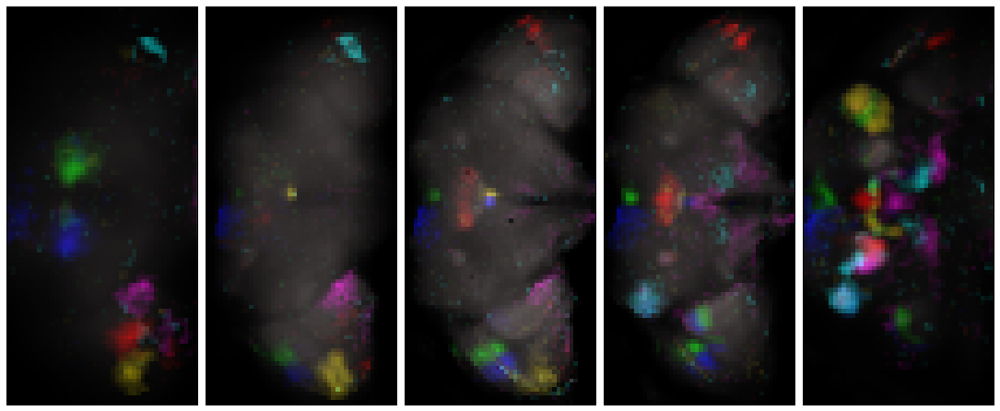

In [216]:
pylab.rcParams['figure.figsize'] = (15, 6)
C2=np.zeros(3)

Df=np.zeros([S[0],S[1],5,3]) 
  
for i in range(3):
    Df[:,:,:,i]=Final_map[:,:,:,i]+Dmean/16
    Df=Df/(np.max(np.max(Df)))
if S[2]>5:
    N=Nstack
else:
    N=S[2]
for i in range(N):
    #if Good_ICs[j]:
        plt.subplot(1,N,i+1)
        plt.imshow(Dmean[:,:,i],cmap=plt.cm.gray)
        plt.imshow(Df[:,:,i,:],cmap=my_cmap,interpolation='none')
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)
plt.tight_layout(pad=0,w_pad=0,h_pad=0)

In [196]:
k=0
J=np.zeros(len(GoodICo[GoodICo==1]))
for j in range(len(GoodICo)):
    if GoodICo[j]:
        print(k)
        print([CompMainName[Indexo[j]]])
        J[k]=j
        k=k+1

0
['ME_L']
1
['ME_L']
2
['ME_L']
3
['ME_L']
4
['ME_R']
5
['LO_L']
6
['LOP_R']
7
['AL_R']
8
['AL_L']
9
['MB_CA_R']
10
['MB_CA_L']
11
['MB_CA_L']
12
['MB_CA_L']
13
['SMP_R']
14
['SMP_L']
15
['LH_R']
16
['LH_L']
17
['IB_L']
18
['PB']
19
['PB']
20
['NO']
21
['NO']
22
['SPS_R']
23
['IPS_L']


Separate in brain regions by hand:

In [197]:
Sets=[range(3),range(3,7),range(7,9),range(9,13),range(13,17),17,range(18,20),range(20,22),range(22,24)]

In [198]:
D2o.shape

(92, 44, 5, 108)

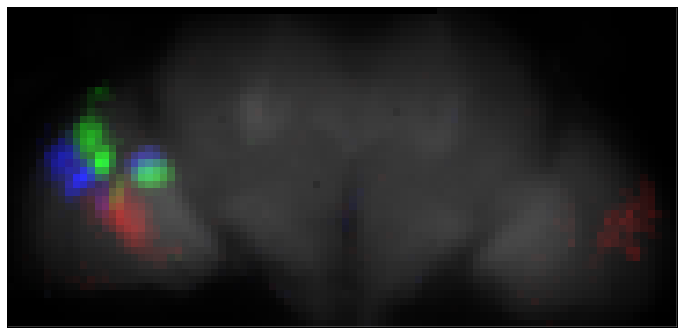

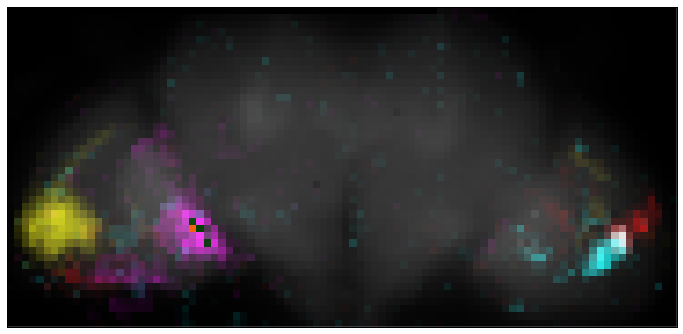

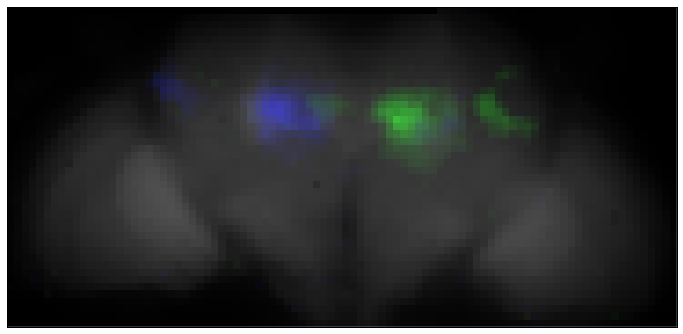

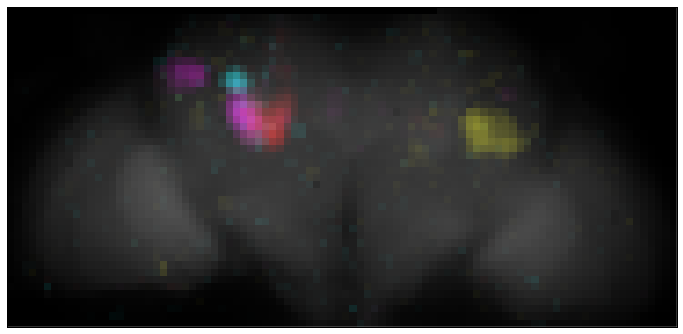

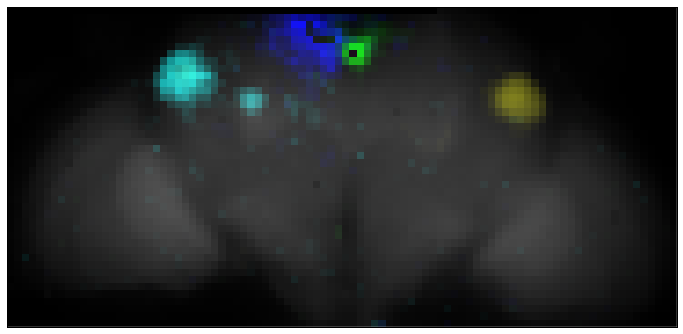

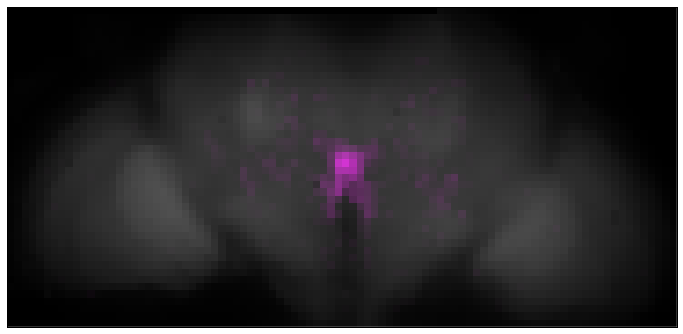

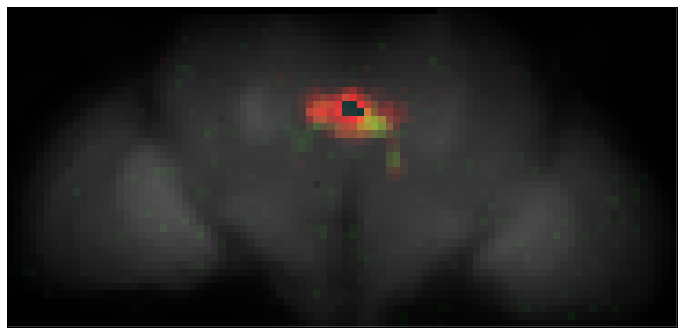

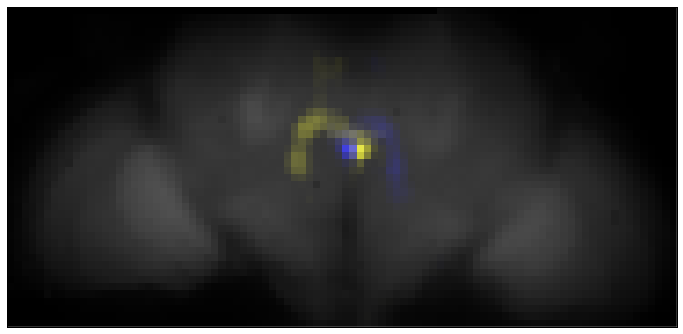

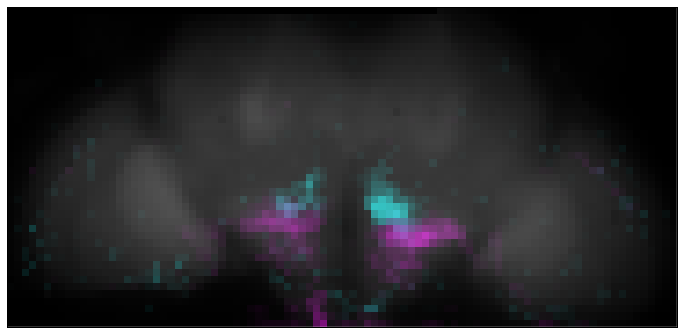

In [211]:
pylab.rcParams['figure.figsize'] = (12, 6)
SetId=np.zeros(1000)
n=0

for i in range(len(Sets)):
    
    Final_map2=np.zeros([S[0],S[1],3]) 
    Fmaps2=np.zeros([S[0],S[1],3]) 
    Final_map3=np.zeros([S[0],S[1],5,3]) 
    Fmaps3=np.zeros([S[0],S[1],5,3])     
     
    if type(Sets[i])==list:
        for j in np.array(Sets[i]):
            C=np.zeros((S[3],3))
            C[j,:]=C1[j%6][:]
            SetId[n]=i
            n=n+1
            for k in range(3):           
                M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]],S[0]*S[1]*5)))
                Fmaps2[:,:,k]=0.9*np.mean(D2o[:,:,:,J[j]],2)*C[j,k]/M
                for l in range(5):
                    M=np.max(np.squeeze(np.reshape(D2o[:,:,l,J[j]],S[0]*S[1],5)))
                    Fmaps3[:,:,l,k]=0.9*D2o[:,:,l,J[j]]*C[j,k]/M                
            Final_map2=Final_map2+Fmaps2
            Final_map3=Final_map3+Fmaps3            
                
    else:
        j=Sets[i]
        C[j,:]=C1[j%6][:]
        SetId[n]=i
        n=n+1
        for k in range(3):           
            M=np.max(np.squeeze(np.reshape(D2o[:,:,:,J[j]],S[0]*S[1]*5)))
            Fmaps2[:,:,k]=0.9*np.mean(D2o[:,:,:,J[j]],2)*C[j,k]/M
            for l in range(5):
                M=np.max(np.squeeze(np.reshape(D2o[:,:,l,J[j]],S[0]*S[1],5)))
                Fmaps3[:,:,l,k]=0.9*D2o[:,:,l,J[j]]*C[j,k]/M 
        Final_map2=Final_map2+Fmaps2
        Final_map3=Final_map3+Fmaps3   
                
    Df=np.zeros([S[0],S[1],3]) 
    Df2=np.zeros([S[0],S[1],5,3]) 
    
    for l in range(3):
        Df[:,:,l]=Final_map2[:,:,l]+np.mean(Dmean,2)/30
        for m in range(5):
            Df2[:,:,m,l]=Final_map3[:,:,m,l]+np.mean(Dmean,2)/30
    MM=np.max(np.max(Df))
    
    Rotated=ndimage.rotate(Df[:,:,:]*2.4,-90)
    a=plt.imshow(Rotated,cmap=my_cmap,interpolation='none')
    frame1 = plt.gca()
    frame1.axes.get_xaxis().set_visible(False)
    frame1.axes.get_yaxis().set_visible(False)

    plt.show()
                                

Stimuli

In [132]:
Tstim=np.arange(0,np.max(Time_fluoICA),0.001)
Flashes=np.zeros(Tstim.shape[0])
Odor=np.zeros(Tstim.shape[0])
for i in range(Tstim.shape[0]):
    if (Tstim[i]>12 and Tstim[i]<14) or (Tstim[i]>16 and Tstim[i]<18) or (Tstim[i]>20 and Tstim[i]<22) or (Tstim[i]>24 and Tstim[i]<26)or (Tstim[i]>28 and Tstim[i]<30)or (Tstim[i]>32 and Tstim[i]<34):
        Flashes[i]=1
    if (Tstim[i]>44 and Tstim[i]<46) or (Tstim[i]>50 and Tstim[i]<52) or (Tstim[i]>56 and Tstim[i]<58):
        Odor[i]=1
Flashes[Flashes==0]=np.nan
Odor[Odor==0]=np.nan    

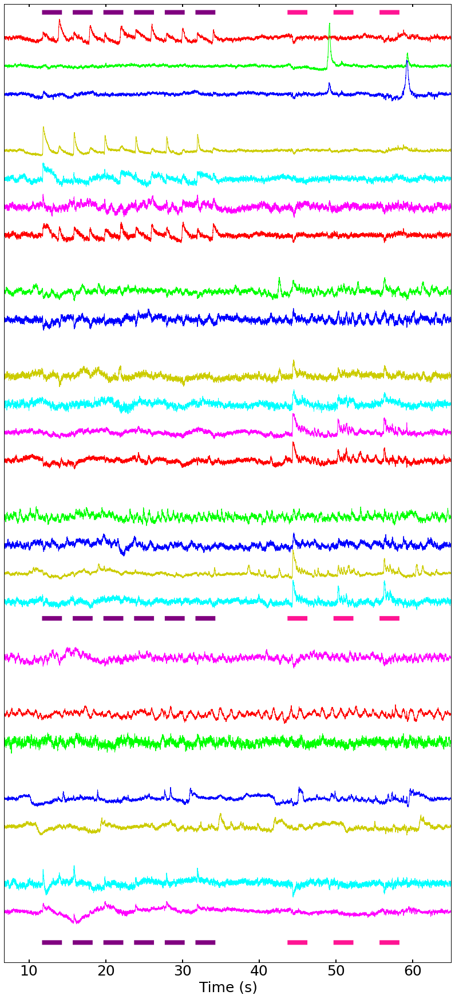

In [215]:
C=np.zeros((S[3],3))
i=0
for j in range(S[3]):  
    if LargerRegionIo[j]<12 and GoodICo[j]:
        C[j,:]=C1[i%6][:]
        i=i+1

pylab.rcParams['figure.figsize'] = (14, 30)
h=10
i=0
plt.plot(Tstim,Flashes+8,linewidth=8,color='purple')
plt.plot(Tstim,Odor+8,linewidth=8,color='deeppink')

for j in range(S[3]):
    if GoodICo[j]:
        plt.plot(Time_fluoICA,(DTo[:,j]/np.sqrt(np.var(DTo[:,j]))-h*i-h*SetId[i]),color=C[j,:]) 
        i=i+1
        
plt.plot(Tstim,Flashes-h*i-h*np.max(SetId)-2,linewidth=8,color='purple')
plt.plot(Tstim,Odor-h*i-h*np.max(SetId)-2,linewidth=8,color='deeppink')

plt.plot(Tstim,Flashes-h*i-h*np.max(SetId)+113,linewidth=8,color='purple')
plt.plot(Tstim,Odor-h*i-h*np.max(SetId)+113,linewidth=8,color='deeppink')

plt.xlim([np.min(Time_fluoICA),np.max(Time_fluoICA)])
plt.ylim([-h*i-h*np.max(SetId)-8,12])
frame1 = plt.gca()
frame1.axes.get_yaxis().set_visible(False)
frame1.axes.set_xlabel('Time (s)')
frame1.xaxis.set_tick_params(width=2,length=5)
matplotlib.rcParams.update({'font.size': 25})
plt.show()


In [214]:
%store

Stored variables and their in-db values:
